# Project Description

# Overview

Introduction:

The objective of this capstone project is to develop a predictive model that can identify fraudulent insurance claims in the auto insurance industry. Insurance fraud is a significant problem, and detecting fraudulent claims manually can be challenging and time-consuming. 

By utilizing machine learning techniques, we can create a model that automates the process of fraud detection, saving time and resources for insurance companies.

In [1]:
# Import Necessary Libraries

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV
import joblib
pd.set_option('display.max_columns', None)

# Importing Dataset

Dataset Description:

The dataset which is used in this project to perform the tasks can be accessed from the following link: https://github.com/dsrscientist/Data-Science-ML-Capstone-Projects/blob/master/Automobile_insurance_fraud.csv

Column Description:
The dataset provided for this project contain various variables related to insurance policies, customer details, and incident information.
Variables include:

1. months_as_customer: Number of months a customer has been with the insurance company.
2. age: The age of the customer.
3. policy_number: Unique identification number assigned to each customer's policy.
4. policy_bind_date: The date when the insurance policy was issued.
5. policy_state: The state where the policy is issued.
6. policy_csl: Combined Single Limit, which represents the maximum coverage amount for the policy.
7. policy_deductable: The amount the customer is responsible for paying towards an insured loss.
8. policy_annual_premium: The annual premium amount paid by the policyholder.
9. umbrella_limit: Additional insurance coverage beyond existing policy limits.
10. insured_zip: The zip code where the insurance policy was issued.
11. insured_sex: The gender of the policyholder.
12. insured_education_level: The educational level of the policyholder.
13. insured_occupation: The occupation of the policyholder.
14. insured_hobbies: Hobbies or leisure activities of the policyholder.
15. insured_relationship: The relationship status of the policyholder.
16. capital-gains: Profits accrued due to insurance premiums.
17. capital-loss: Losses incurred due to insurance claims.
18. incident_date: The date when the insurance claim was made.
19. incident_type: The type of claim or vehicle damage reported.
20. collision_type: The area of damage on the vehicle.
21. incident_severity: The extent or severity of the damage.
22. authorities_contacted: Government agencies contacted after the incident.
23. incident_state: The state where the accident occurred.
24. incident_city: The city where the accident occurred.
25. incident_location: The location where the accident occurred.
26. incident_hour_of_the_day: The hour of the day when the accident took place.
27. number_of_vehicles_involved: The number of vehicles involved in the accident.
28. property_damage: Whether property was damaged or not.
29. bodily_injuries: The number of bodily injuries sustained.
30. witnesses: The number of witnesses involved.
31. police_report_available: Whether a police report on the damage was documented.
32. total_claim_amount: The total financial claim amount.
33. injury_claim: The claim amount for physical injuries.
34. property_claim: The claim amount for property damages.
35. vehicle_claim: The claim amount for vehicle damages.
36. auto_make: The make of the vehicle.
37. auto_model: The model of the vehicle.
38. auto_year: The year the vehicle was manufactured.
39. _c39: Unknown variable.
40. fraud_reported: The target variable indicating whether the claim is fraudulent or not (1 - fraudulent, 0 - not fraudulent).

In [2]:
df= pd.read_csv("insurance.csv")
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
df= df.drop(['policy_number', 'policy_bind_date', 'incident_date', 'incident_location','_c39'], axis=1)

In [4]:
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,?,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [5]:
df.tail()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
995,3,38,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N
999,456,60,OH,250/500,1000,766.19,0,612260,FEMALE,Associate,sales,kayaking,husband,0,0,Parked Car,?,Minor Damage,Police,WV,Columbus,6,1,?,0,3,?,5060,460,920,3680,Mercedes,E400,2007,N


# Exploratory Data Analysis(EDA)

It is an approach to analyze the datasets, and summarize their characteristics. Here we are analyzing dataset by first checking with the dimensions of the dataset, then checking for the null values present in the dataset, followed by the memory usage detail by using info() function, checking with value counts and unique values present in dataset, followed by statistical summary of dataset(numerical column), which ends with graphical analysis.

Let's start with checking the dimension of the dataset using df.shape attribute, then we will be seeing df.columns and df.dtypes attributes to check the columns and their datatypes, which will be followed by isnull().sum() function which will check the missing data present in each column of the dataset. We will also visualize the null values using heatmap to clear the confusion. And then we will be describing the statistical summary by using df.describe() function.

In [6]:
# Check the dimension
df.shape

(1000, 35)

In [7]:
# Check the columns name
df.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'umbrella_limit',
       'insured_zip', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'capital-gains', 'capital-loss', 'incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

In [8]:
# Check the datatype
df.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                

As we can see here three different type of datatypes are present i.e., int64(16), float64(1), and object(18).

In [9]:
# Check the null values of each columns
df.isnull().sum()

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_cl

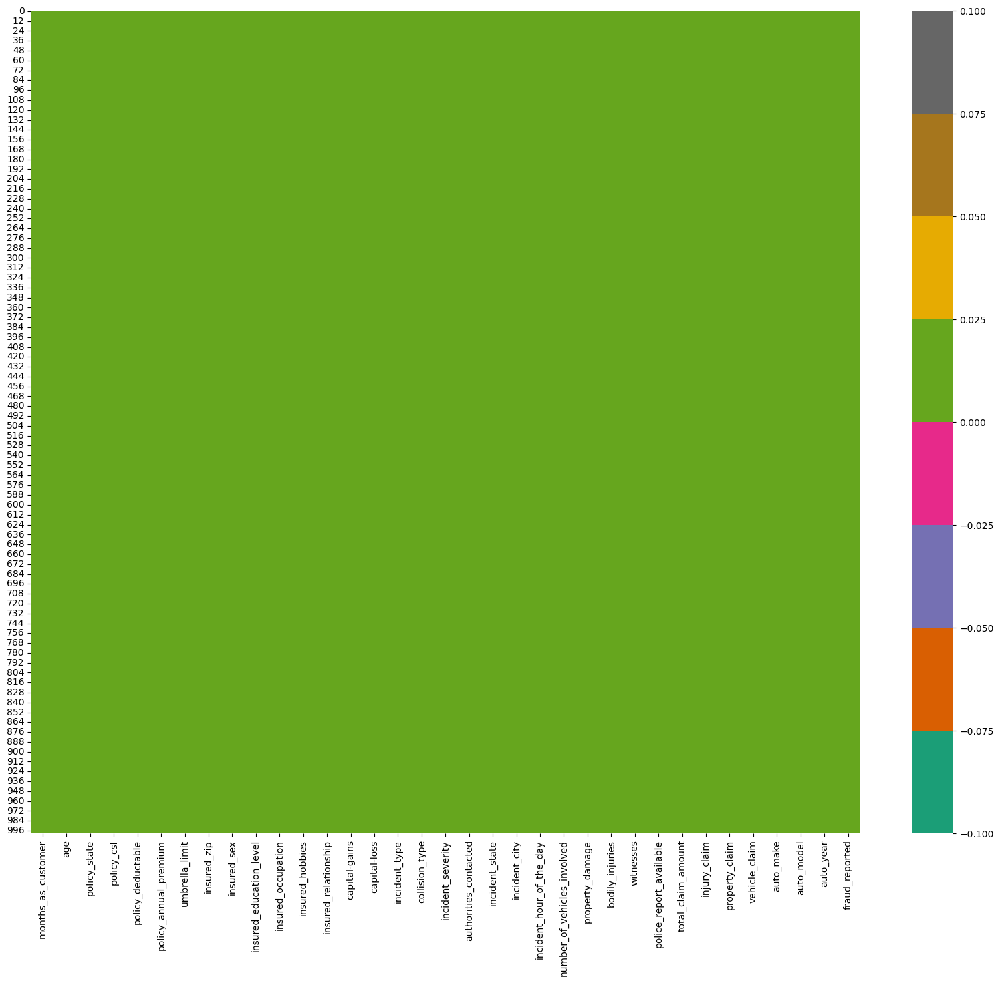

In [10]:
# Let's visualize the null values by using heatmap

plt.figure(figsize= (20,16))
sns.heatmap(df.isnull(), cmap= 'Dark2')
plt.show()

As we can see there is no null values present in any of the columns.

In [11]:
# Check the details of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_state                 1000 non-null   object 
 3   policy_csl                   1000 non-null   object 
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   int64  
 7   insured_zip                  1000 non-null   int64  
 8   insured_sex                  1000 non-null   object 
 9   insured_education_level      1000 non-null   object 
 10  insured_occupation           1000 non-null   object 
 11  insured_hobbies              1000 non-null   object 
 12  insured_relationship         1000 non-null   object 
 13  capital-gains      

In [12]:
# Let's looping through each column to get value counts

for col in df.columns:
    print("Value counts for{col}:")
    print(df[col].value_counts())

Value counts for{col}:
194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
Value counts for{col}:
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
Value counts for{col}:
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64
Value counts for{col}:
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64
Value counts for{col}:
1000    351
500     342
2000    307
Name: policy_deductable, dtype: int64
Value counts for{col}:
1558.29    2
1215.36    2
1362.87    2
1073.83    2
1389.

In [13]:
# loop through each column to get unique values
for col in df.columns:
    print("Unique values in {col}:")
    print(df[col].unique())

Unique values in {col}:
[328 228 134 256 137 165  27 212 235 447  60 121 180 473  70 140 160 196
 460 217 370 413 237   8 257 202 224 241  64 166 155 114 149 147  62 289
 431 199  79 116  37 106 269 265 163 355 175 192 430  91 223 195  22 439
  94  11 151 154 245 119 215 295 254 107 478 128 338 271 222 120 270 319
 194 227 244  78 200 284 275 153  31  41 127  61 207 219  80 325  29 239
 279 350 464 118 298  87 261 453 210 168 390 258 225 164 255 206 203 211
 274  81 280 112  24  93 171 124 287 122 398 214 209  82 193 288 104 101
 375 461 428  45 136 216 278 108  14 276  47  73 294 324  53 426 111  86
 296 125 177 238 449 252 359  19 285  30 342 468 343 404  63 335 142 272
  69  38 281 246 330 362 371 377 172  99 249 190 174  95   2 117 242 440
  20 208 156 232  84 394  35 369 332 243 264  32 259 186 201 436 189 105
  88  40  59  39 123 231 247  48 267 286 253  10 158   1  85 233 266  97
 399 305 129 283  96 176 159 290 299  66 334 429  15 230 250  65 475  77
 229 110 292 451 150 291 16

In [14]:
# Description of Dataset
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


This statistical summary of numerical columns include the count, mean, standard deviation, minimum value, 25th percentile (Q1), median (50th percentile or Q2), 75th percentile (Q3), and maximum value for each variable.

These statistics will be providing an overview of the distribution and range of values for each numerical feature in your dataset. They will be useful for understanding the central tendency, spread, and potential outliers in the data.

# Data Visualization- Graphical Analysis

Here we will be performing data visualization techniques like Univariate, Bivariate , and Multivariate analysis to visually explore and analyze the data. It will helps us in gaining the insights into the patterns,distribution, and relatioship present in dataset. For plotting different graphs we wil be import seaborn and matplotlib Python libraries. By creating various plots, we can easly visualize the data.

Univariate Analysis

Here, to perform univariate analysis in numerical column we will be using Histogram plot, Density plot,and boxplot. Using a bar plot to each categorical column and will see the distribution, skewness and presence of outliers in the data present in each columns.

A. Numerical Columns

1. 'months_as_customer'

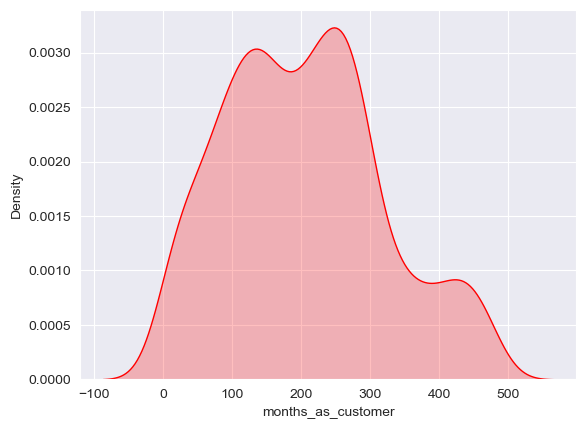

In [15]:
# Now let's analyze the 'months_as_customer' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["months_as_customer"], shade=True, color='red')
plt.show()

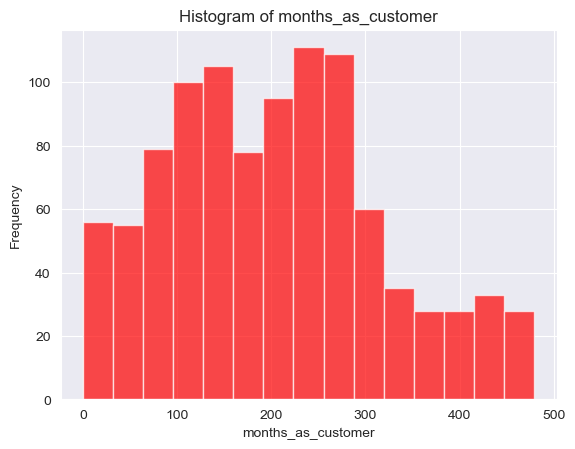

In [16]:
# Let's analyze the 'months_as_customer' column by using histogram plot

plt.hist(df['months_as_customer'], bins= 'auto', color= 'red', alpha=0.7)
plt.xlabel('months_as_customer')
plt.ylabel('Frequency')
plt.title('Histogram of months_as_customer')
plt.show()

Here we can see in the plots that distribution is bimodal with the peak is in between 200-300.

2. 'age'

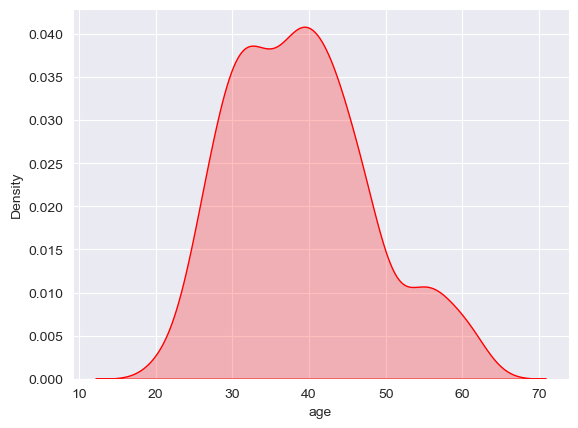

In [17]:
# Now let's analyze the 'age' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["age"], shade=True, color='red')
plt.show()

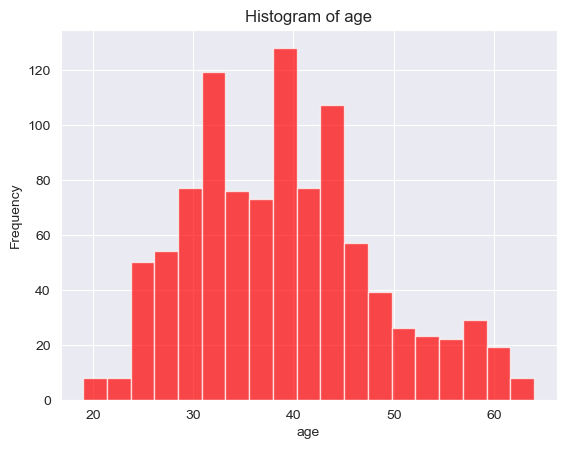

In [18]:
# Let's analyze the 'age' column by using histogram plot

plt.hist(df['age'], bins= 'auto', color= 'red', alpha=0.7)
plt.xlabel('age')
plt.ylabel('Frequency')
plt.title('Histogram of age')
plt.show()

As we can see in both the plots that distribution is normal with a peak is at 40 .

3. 'policy_deductable'

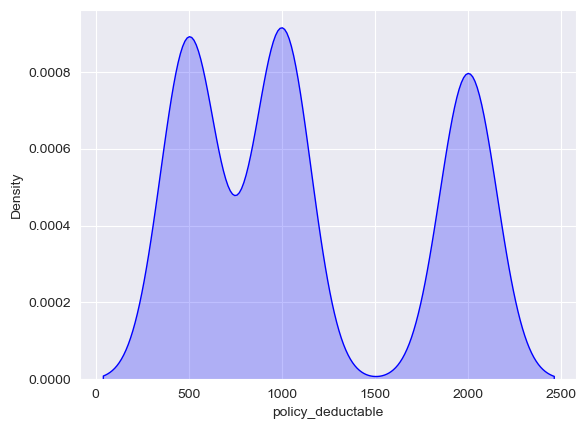

In [19]:
# Now let's analyze the 'policy_deductable' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["policy_deductable"], shade=True, color='blue')
plt.show()

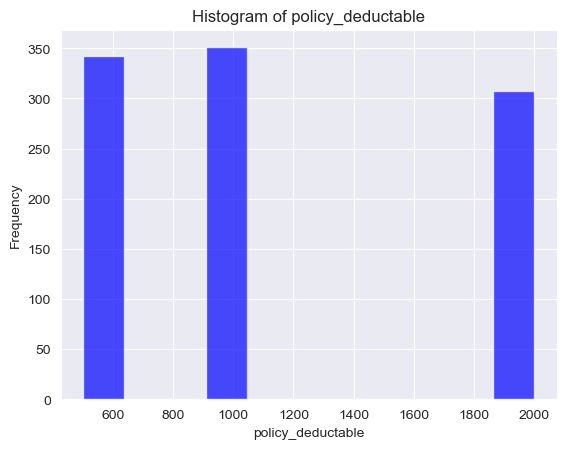

In [20]:
# Let's analyze the 'policy_deductable' column by using histogram plot

plt.hist(df['policy_deductable'], bins= 'auto', color= 'blue', alpha=0.7)
plt.xlabel('policy_deductable')
plt.ylabel('Frequency')
plt.title('Histogram of policy_deductable')
plt.show()

As we can see distribution is comb like structure with peak at 1000.

4. 'policy_annual_premium'

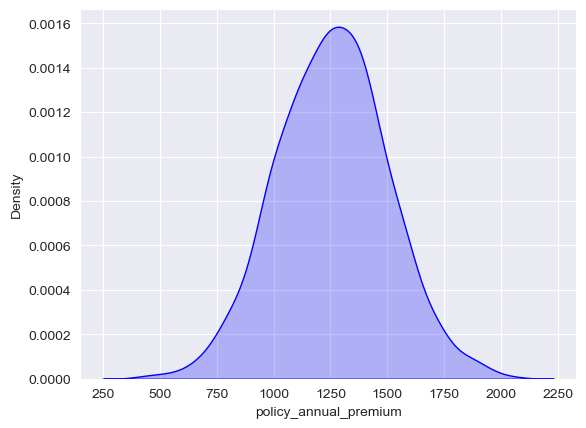

In [21]:
# Now let's analyze the 'policy_annual_premium' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["policy_annual_premium"], shade=True, color='blue')
plt.show()

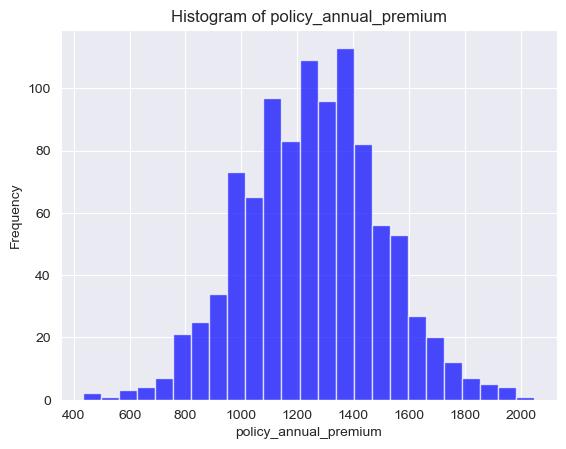

In [22]:
# Let's analyze the 'policy_annual_premium' column by using histogram plot

plt.hist(df['policy_annual_premium'], bins= 'auto', color= 'blue', alpha=0.7)
plt.xlabel('policy_annual_premium')
plt.ylabel('Frequency')
plt.title('Histogram of policy_annual_premium')
plt.show()

Here we can see in both the plots that distribution is normal with the highest peak is at 1400.

5. 'umbrella_limit'

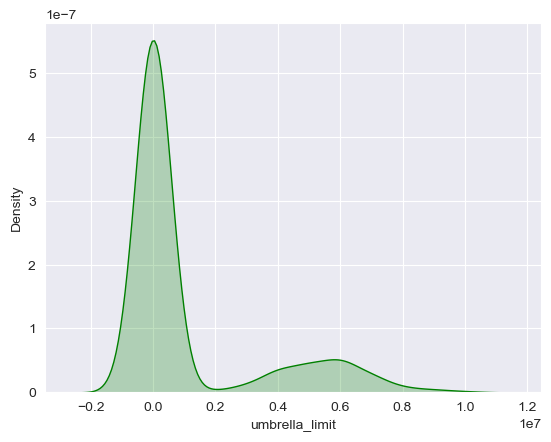

In [23]:
# Now let's analyze the 'umbrella_limit' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["umbrella_limit"], shade=True, color='green')
plt.show()

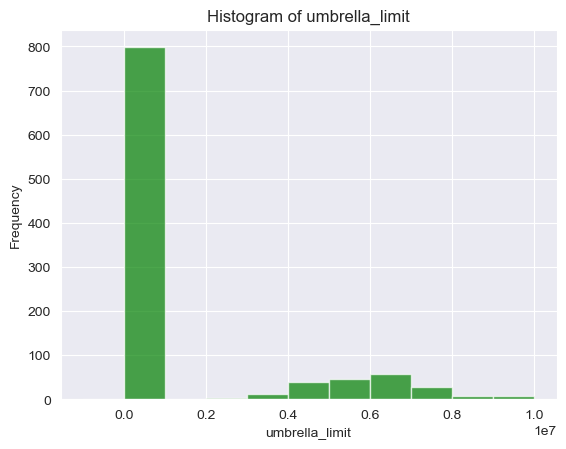

In [24]:
# Let's analyze the 'umbrella_limit' column by using histogram plot

plt.hist(df['umbrella_limit'], bins= 'auto', color= 'green', alpha=0.7)
plt.xlabel('umbrella_limit')
plt.ylabel('Frequency')
plt.title('Histogram of umbrella_limit')
plt.show()

Here we can see in both the plots that there is bimodal distribution with peak is around 0

6. 'insured_zip'

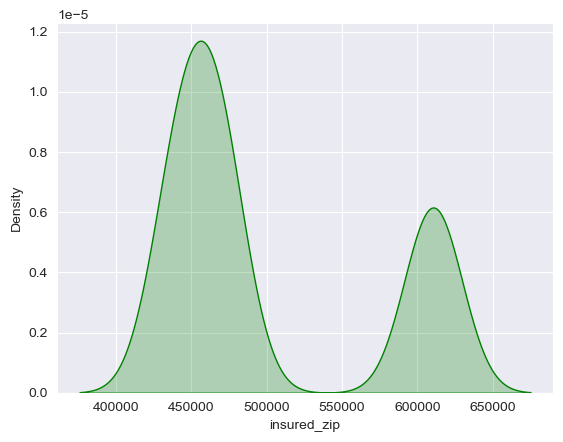

In [25]:
# Now let's analyze the 'insured_zip' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["insured_zip"], shade=True, color='green')
plt.show()

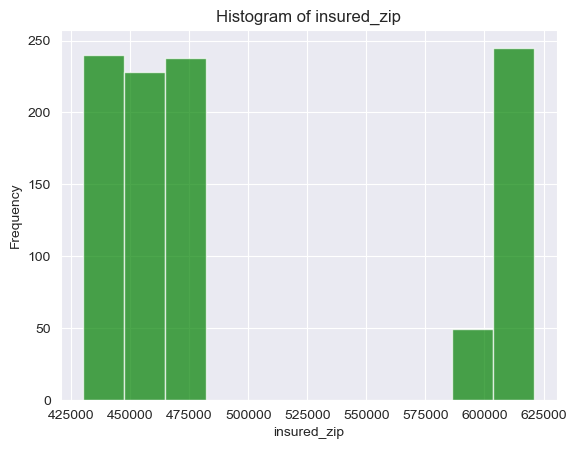

In [26]:
# Let's analyze the 'insured_zip' column by using histogram plot

plt.hist(df['insured_zip'], bins= 'auto', color= 'green', alpha=0.7)
plt.xlabel('insured_zip')
plt.ylabel('Frequency')
plt.title('Histogram of insured_zip')
plt.show()

As we can see in the plots that there is bomodal distribution with peak at the larger values.

7. 'capital-gains'

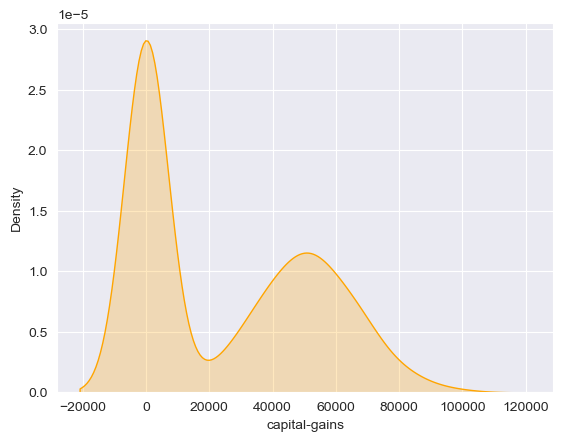

In [27]:
# Now let's analyze the 'capital-gains' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["capital-gains"], shade=True, color='orange')
plt.show()

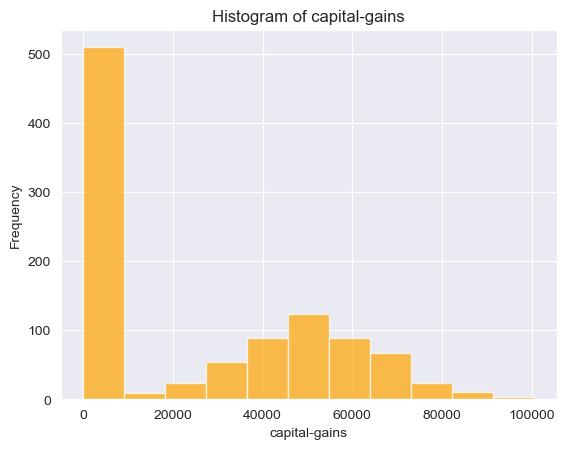

In [28]:
# Let's analyze the 'capital-gains' column by using histogram plot

plt.hist(df['capital-gains'], bins= 'auto', color= 'orange', alpha=0.7)
plt.xlabel('capital-gains')
plt.ylabel('Frequency')
plt.title('Histogram of capital-gains')
plt.show()

Here we can see in both plots that data distribution is edge peak at 0.

8. 'captital-loss'

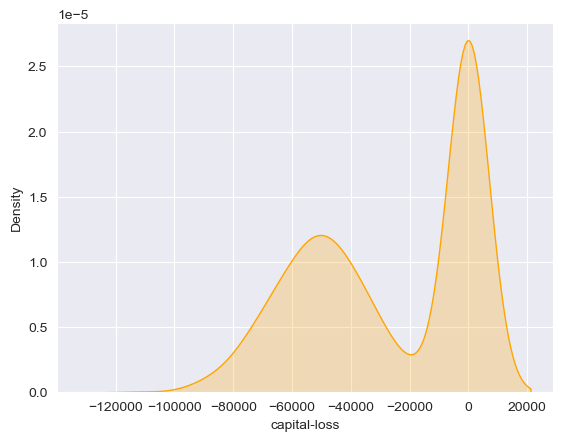

In [29]:
# Now let's analyze the 'capital-loss' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["capital-loss"], shade=True, color='orange')
plt.show()

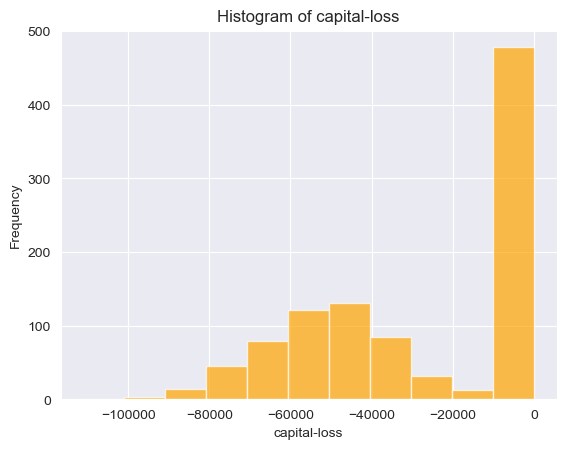

In [30]:
# Let's analyze the 'capital-loss' column by using histogram plot

plt.hist(df['capital-loss'], bins= 'auto', color= 'orange', alpha=0.7)
plt.xlabel('capital-loss')
plt.ylabel('Frequency')
plt.title('Histogram of capital-loss')
plt.show()

Here too we can see same observation as above.

9. 'incident_hour_of_the_day'

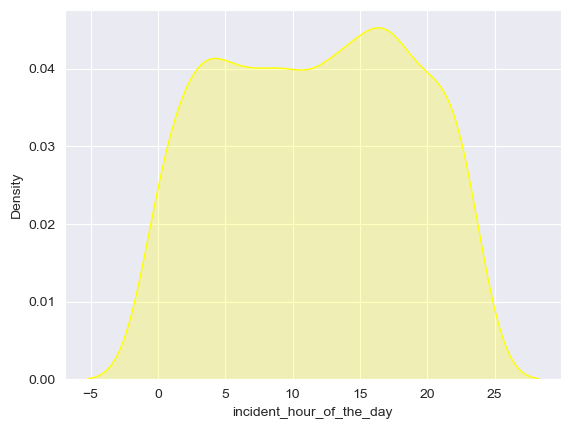

In [31]:
# Now let's analyze the 'incident_hour_of_the_day' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["incident_hour_of_the_day"], shade=True, color='yellow')
plt.show()

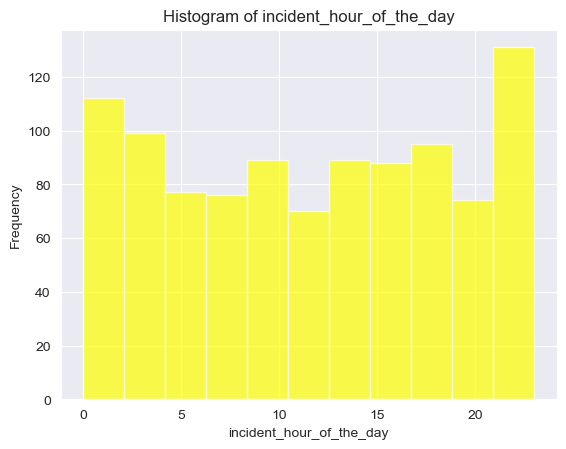

In [32]:
# Let's analyze the 'incident_hour_of_the_day' column by using histogram plot

plt.hist(df['incident_hour_of_the_day'], bins= 'auto', color= 'yellow', alpha=0.7)
plt.xlabel('incident_hour_of_the_day')
plt.ylabel('Frequency')
plt.title('Histogram of incident_hour_of_the_day')
plt.show()

Here we can see uniform dustribution with the peak is at higher end.

10. 'number_of_vehicles_involved'

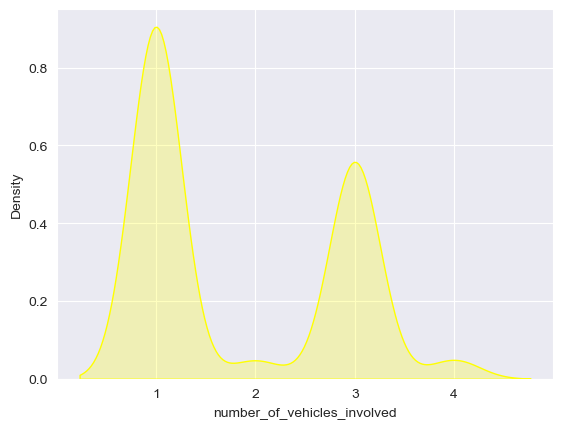

In [33]:
# Now let's analyze the 'number_of_vehicles_involved column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["number_of_vehicles_involved"], shade=True, color='yellow')
plt.show()

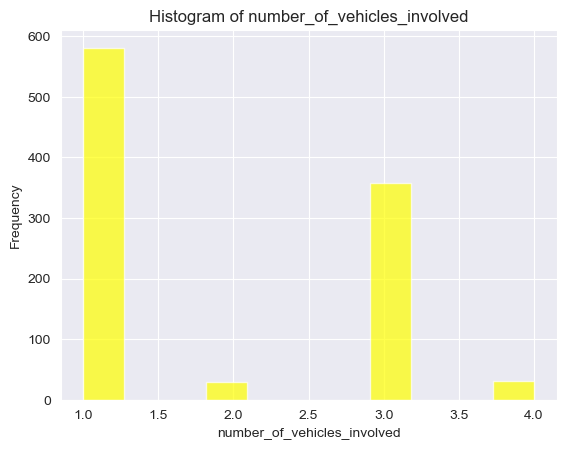

In [34]:
# Let's analyze the 'number_of_vehicles_involved' column by using histogram plot

plt.hist(df['number_of_vehicles_involved'], bins= 'auto', color= 'yellow', alpha=0.7)
plt.xlabel('number_of_vehicles_involved')
plt.ylabel('Frequency')
plt.title('Histogram of number_of_vehicles_involved')
plt.show()

Here too we can see bimodal distribution with peak is at initial values.

11. 'bodily_injuries'

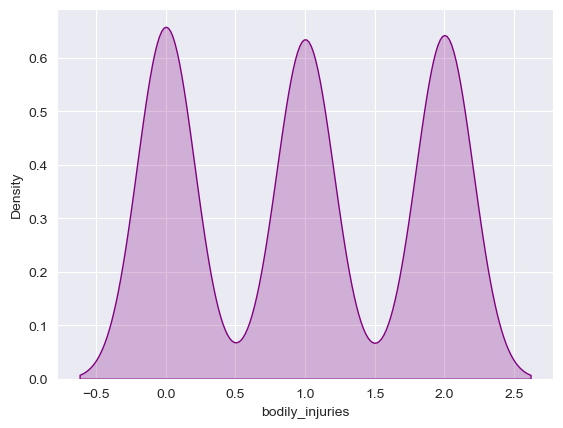

In [35]:
# Now let's analyze the 'bodily_injuries' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["bodily_injuries"], shade=True, color='purple')
plt.show()

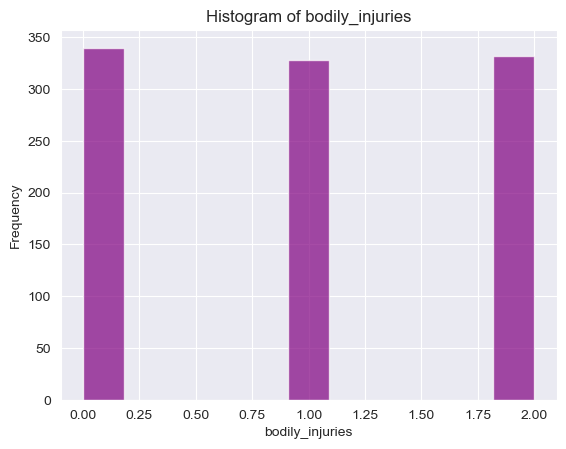

In [36]:
# Let's analyze the 'bodily_injuries' column by using histogram plot

plt.hist(df['bodily_injuries'], bins= 'auto', color= 'purple', alpha=0.7)
plt.xlabel('bodily_injuries')
plt.ylabel('Frequency')
plt.title('Histogram of bodily_injuries')
plt.show()

Here we can see the comb like distribution with more than two peak, highest in between 0.0-0.25.

12. 'witnesses'

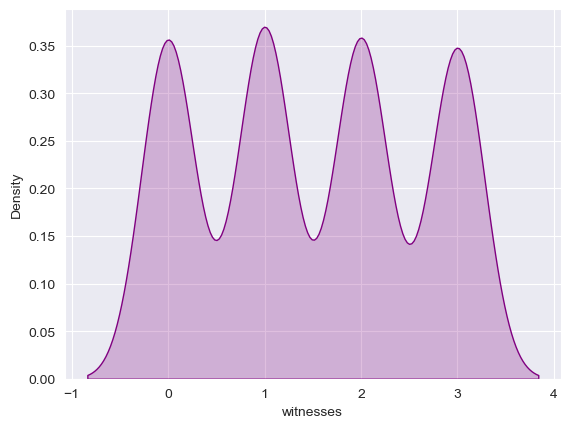

In [37]:
# Now let's analyze the 'witnesses' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["witnesses"], shade=True, color='purple')
plt.show()

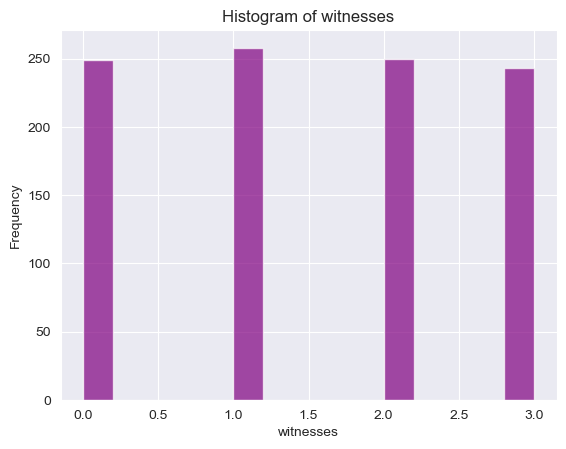

In [38]:
# Let's analyze the 'witnesses' column by using histogram plot

plt.hist(df['witnesses'], bins= 'auto', color= 'purple', alpha=0.7)
plt.xlabel('witnesses')
plt.ylabel('Frequency')
plt.title('Histogram of witnesses')
plt.show()

Here too we can see comb like distribution with four different peak, highest is at 1.0

13. 'total_claim_amount'

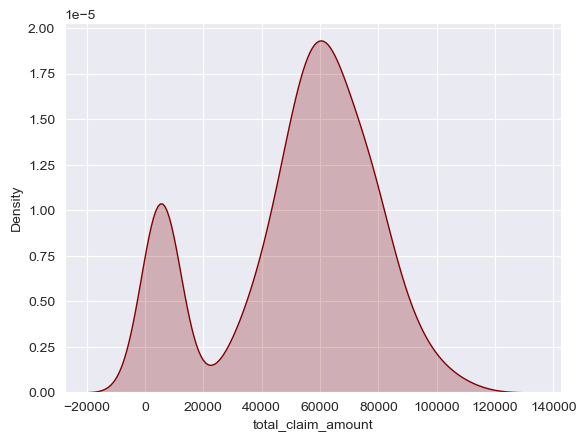

In [39]:
# Now let's analyze the 'total_claim_amount' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["total_claim_amount"], shade=True, color='maroon')
plt.show()

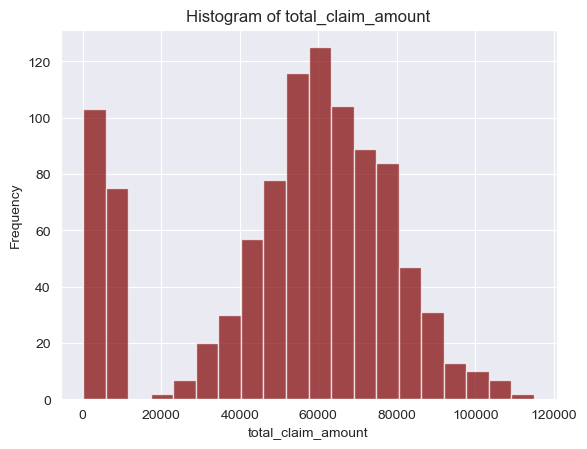

In [40]:
# Let's analyze the 'total_claim_amount' column by using histogram plot

plt.hist(df['total_claim_amount'], bins= 'auto', color= 'maroon', alpha=0.7)
plt.xlabel('total_claim_amount')
plt.ylabel('Frequency')
plt.title('Histogram of total_claim_amount')
plt.show()

Here we can see edge peak distribution with peak is at 60000.

14. 'injury_claim'

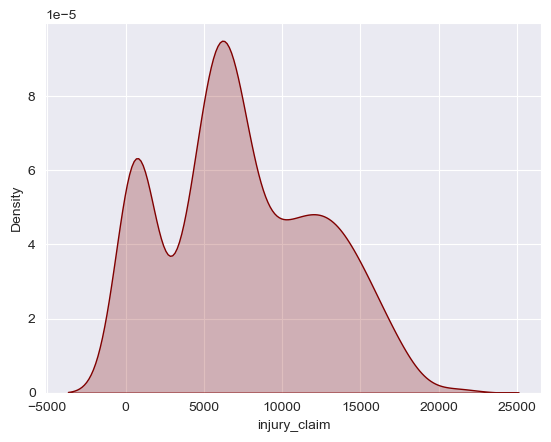

In [41]:
# Now let's analyze the 'injury_claim' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["injury_claim"], shade=True, color='maroon')
plt.show()

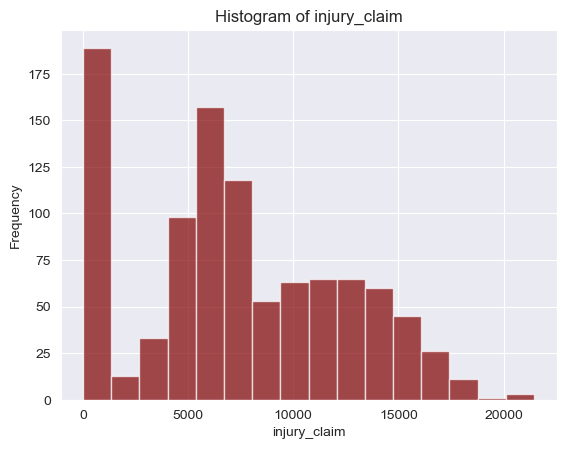

In [42]:
# Let's analyze the 'injury_claim' column by using histogram plot

plt.hist(df['injury_claim'], bins= 'auto', color= 'maroon', alpha=0.7)
plt.xlabel('injury_claim')
plt.ylabel('Frequency')
plt.title('Histogram of injury_claim')
plt.show()

As we can see in both the plots distribution type is edge peak at 0.

15. 'property_claim'

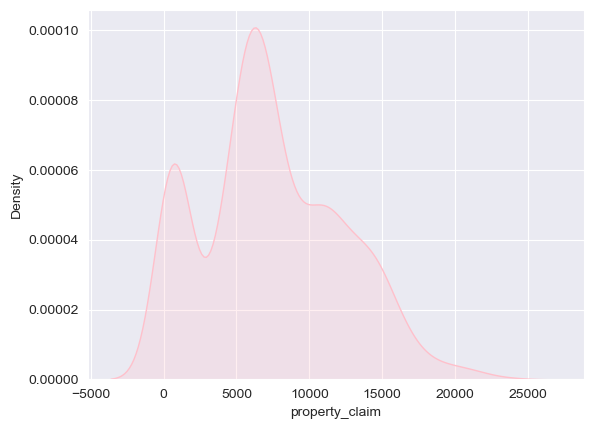

In [43]:
# Now let's analyze the 'property_claim' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["property_claim"], shade=True, color='pink')
plt.show()

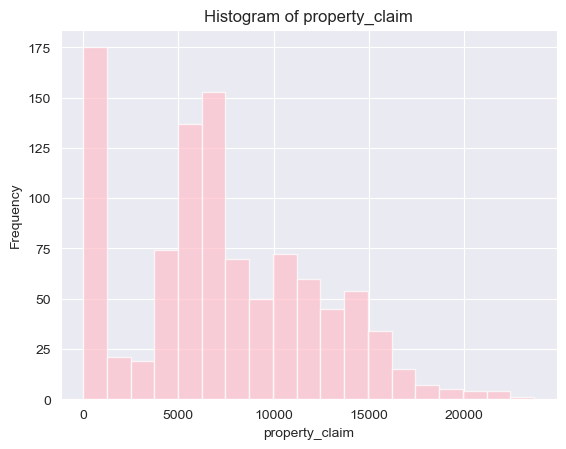

In [44]:
# Let's analyze the 'property_claim' column by using histogram plot

plt.hist(df['property_claim'], bins= 'auto', color= 'pink', alpha=0.7)
plt.xlabel('property_claim')
plt.ylabel('Frequency')
plt.title('Histogram of property_claim')
plt.show()

Here we can see the edge peak distribution at peak 0

16. 'vehicle_claim'

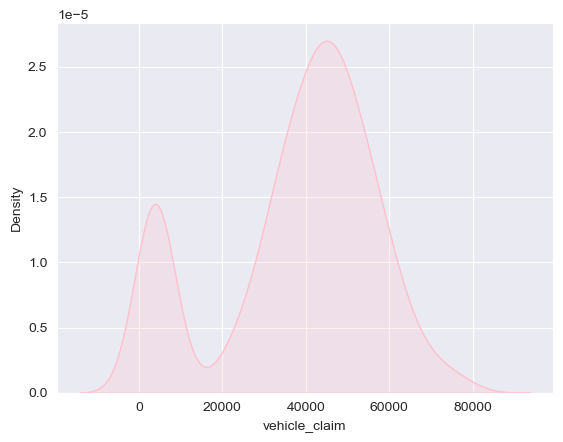

In [45]:
# Now let's analyze the 'vehicle_claim' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["vehicle_claim"], shade=True, color='pink')
plt.show()

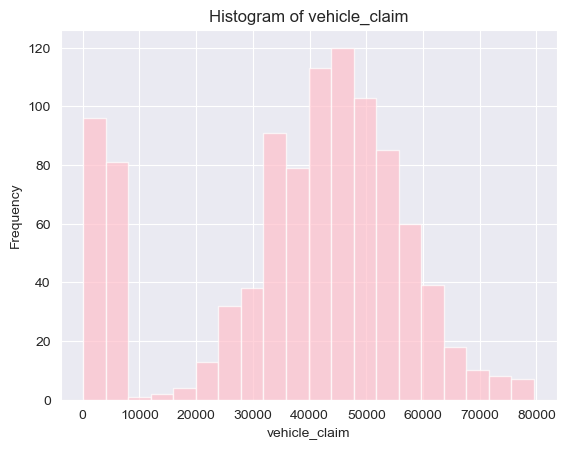

In [46]:
# Let's analyze the 'vehicle_claim' column by using histogram plot

plt.hist(df['vehicle_claim'], bins= 'auto', color= 'pink', alpha=0.7)
plt.xlabel('vehicle_claim')
plt.ylabel('Frequency')
plt.title('Histogram of vehicle_claim')
plt.show()

Here too we can see the edge peak distribution with highest peak is around 40000.

17. 'auto_year'

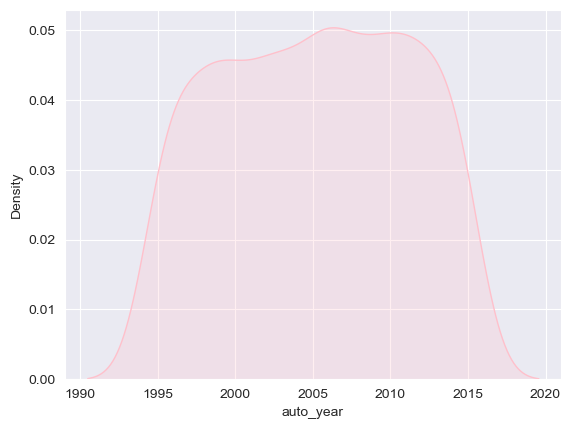

In [47]:
# Now let's analyze the 'auto_year' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["auto_year"], shade=True, color='pink')
plt.show()

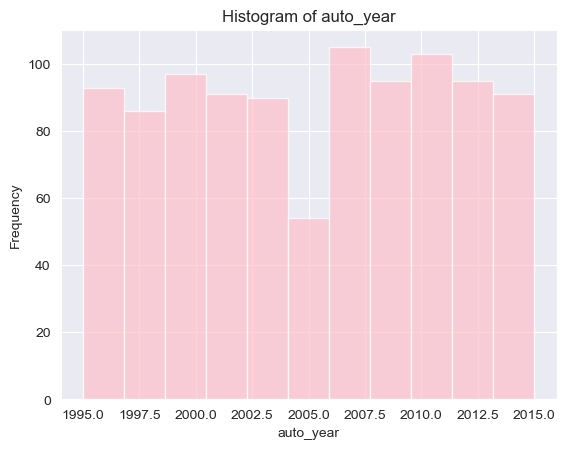

In [48]:
# Let's analyze the 'auto_year' column by using histogram plot

plt.hist(df['auto_year'], bins= 'auto', color= 'pink', alpha=0.7)
plt.xlabel('auto_year')
plt.ylabel('Frequency')
plt.title('Histogram of auto_year')
plt.show()

Here we can see uniform distribution at peak 2007 mid.

B. Categorical Columns

1. 'policy_state'

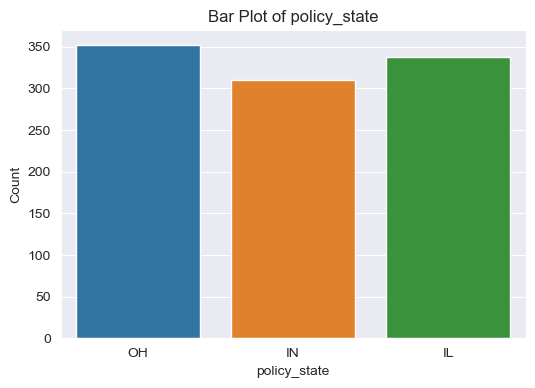

In [49]:
# Let's visualize the 'policy_state' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='policy_state', data=df)
plt.xlabel('policy_state')
plt.ylabel('Count')
plt.title('Bar Plot of policy_state')
plt.show()

Here we can see the OH(ohio) states have maximun policy count, followed by IL(Illinois), and then IN(Indiana).

2. 'policy_csl'

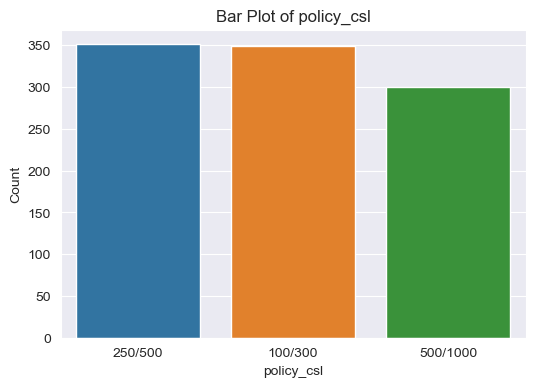

In [50]:
# Let's visualize the 'policy_csl' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='policy_csl', data=df)
plt.xlabel('policy_csl')
plt.ylabel('Count')
plt.title('Bar Plot of policy_csl')
plt.show()

Here plots shows that majority of the insurance policies here covered 250/500 claim format.

3. 'insured_sex'

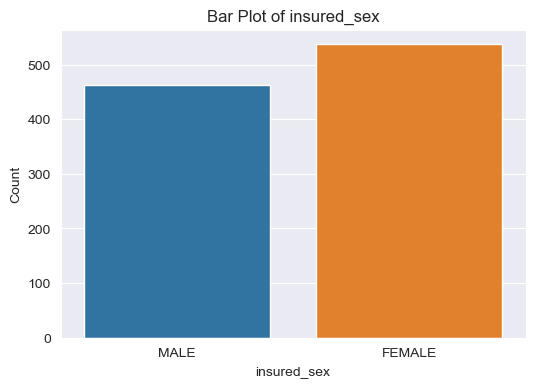

In [51]:
# Let's visualize the 'insured_sex' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='insured_sex', data=df)
plt.xlabel('insured_sex')
plt.ylabel('Count')
plt.title('Bar Plot of insured_sex')
plt.show()

As we can see in the analysis that te count of insured female is more than male.

4. 'insured_education_level'

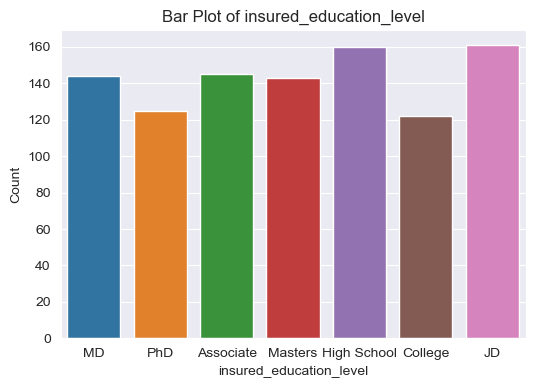

In [52]:
# Let's visualize the 'insured_education_level' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='insured_education_level', data=df)
plt.xlabel('insured_education_level')
plt.ylabel('Count')
plt.title('Bar Plot of insured_education_level')
plt.show()

As we can see the count of JD(Juris Doctor) is the highest as insured individual, followed by highschool which is just slightly low.

5. 'insured_occupation'

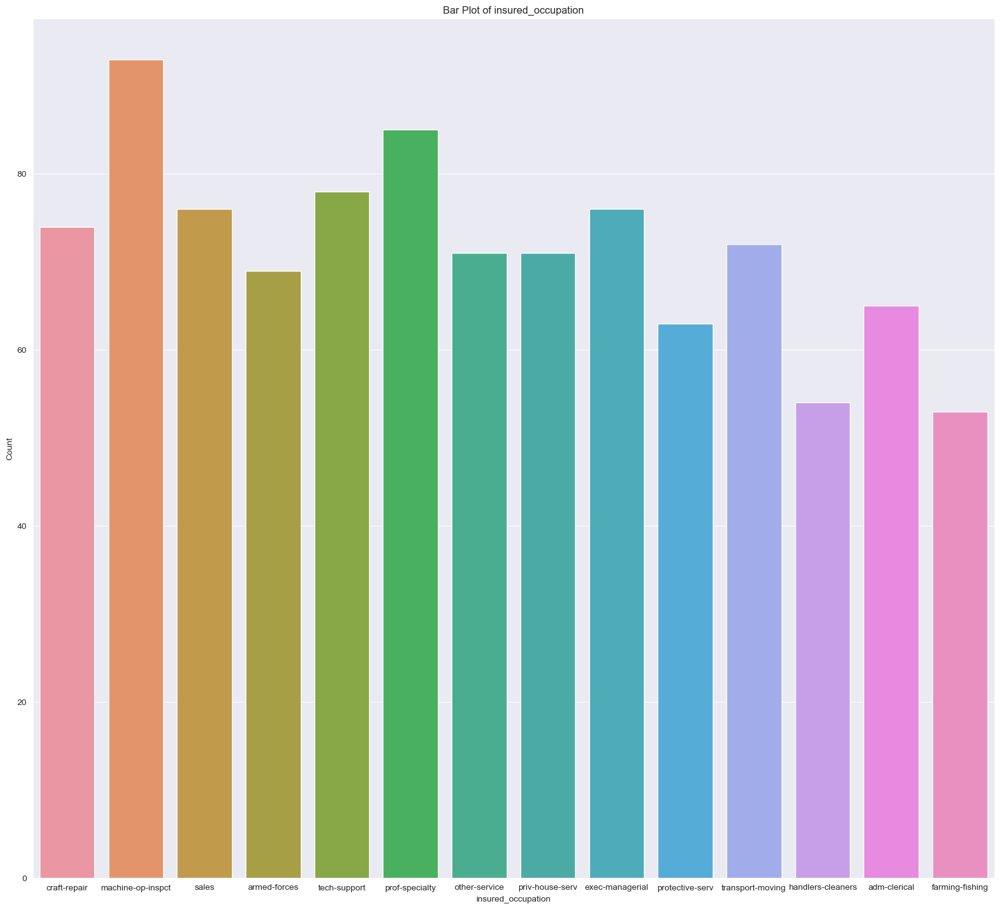

In [53]:
# Let's visualize the 'insured_occupation' column by bar plot

plt.figure(figsize=(20,18))
sns.countplot(x='insured_occupation', data=df)
plt.xlabel('insured_occupation')
plt.ylabel('Count')
plt.title('Bar Plot of insured_occupation')
plt.show()

As we can see here in this plot the highest insured occupation is machine-op-inspct followed by prof-speciality, and then tech-support.

6. 'insured_hobbies'

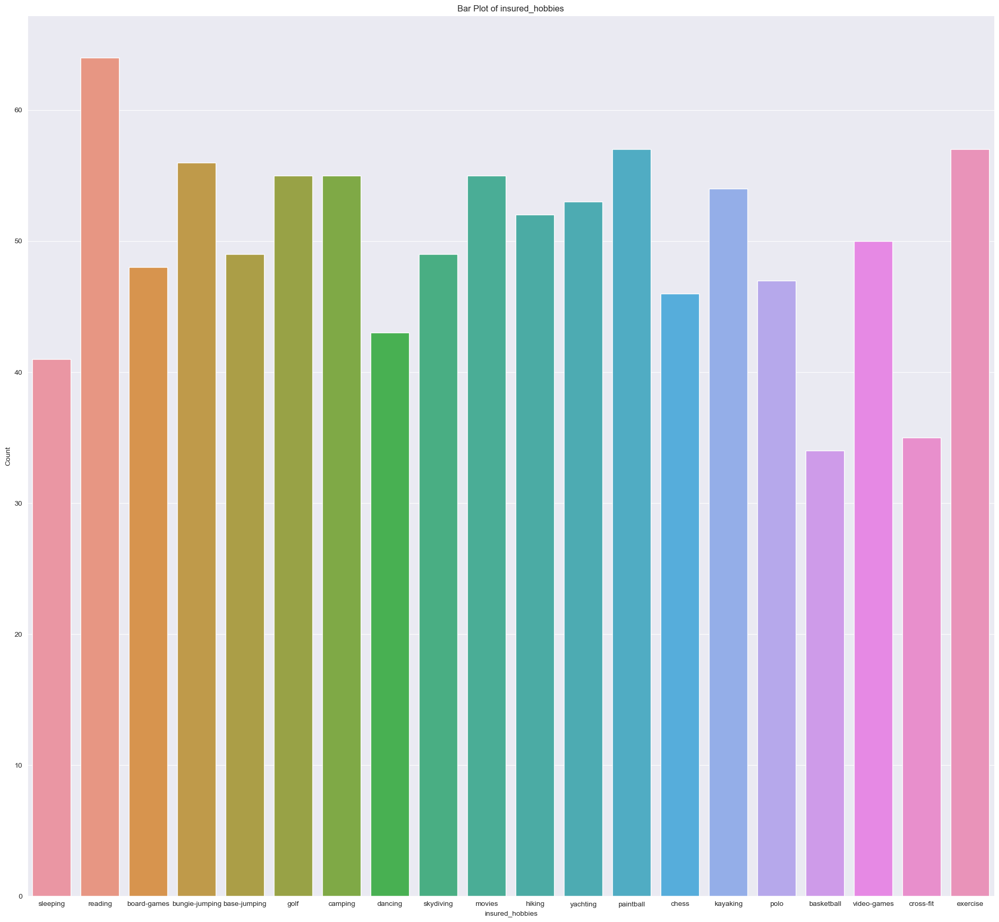

In [54]:
# Let's visualize the 'insured_hobbies' column by bar plot

plt.figure(figsize=(24,22))
sns.countplot(x='insured_hobbies', data=df)
plt.xlabel('insured_hobbies')
plt.ylabel('Count')
plt.title('Bar Plot of insured_hobbies')
plt.show()

Here we can see that reading is the highest insured hobbies.

7. 'insured_relationship'

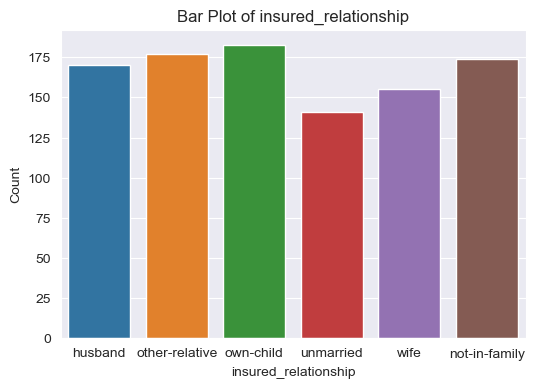

In [55]:
# Let's visualize the 'insured_relationship' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='insured_relationship', data=df)
plt.xlabel('insured_relationship')
plt.ylabel('Count')
plt.title('Bar Plot of insured_relationship')
plt.show()

As we can see in the plot that own-child is the highest insured relationship.

8. 'incident_type'

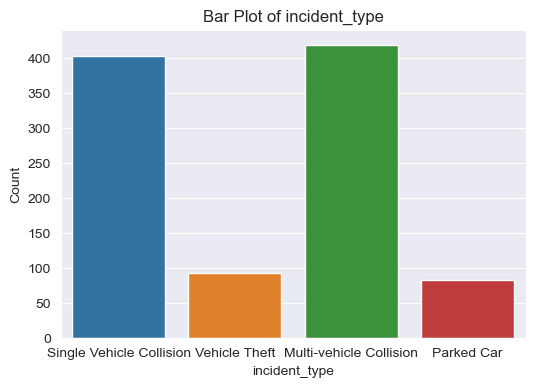

In [56]:
# Let's visualize the 'incident_type' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='incident_type', data=df)
plt.xlabel('incident_type')
plt.ylabel('Count')
plt.title('Bar Plot of incident_type')
plt.show()

Here we can see count of multivehicle collision type is the highest followed by single vehicle.

9. 'collision_type'

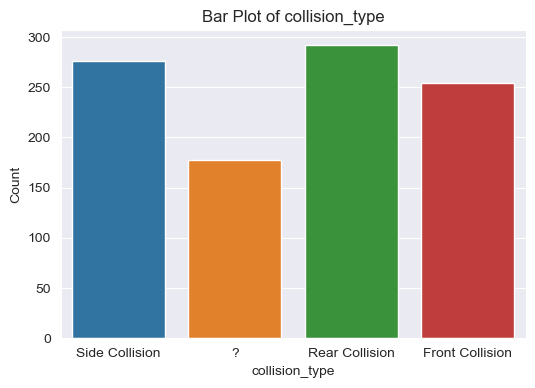

In [57]:
# Let's visualize the 'collision_type' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='collision_type', data=df)
plt.xlabel('collision_type')
plt.ylabel('Count')
plt.title('Bar Plot of collision_type')
plt.show()

Here we can see count of rear collision is the highest.

10. 'incident_severity'

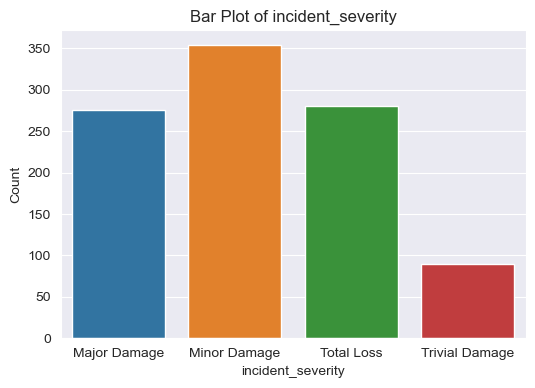

In [58]:
# Let's visualize the 'incident_severity' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='incident_severity', data=df)
plt.xlabel('incident_severity')
plt.ylabel('Count')
plt.title('Bar Plot of incident_severity')
plt.show()

Here we can see that the minor damage is the highest severiry followed buy major and then total loss.

11. 'authorities_contacted'

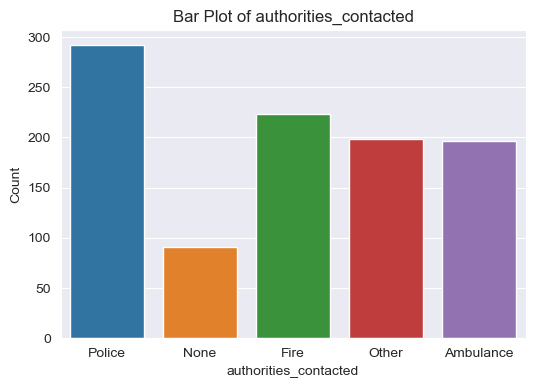

In [59]:
# Let's visualize the 'authorities_contacted' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='authorities_contacted', data=df)
plt.xlabel('authorities_contacted')
plt.ylabel('Count')
plt.title('Bar Plot of authorities_contacted')
plt.show()

Here we can see the police is the highest contacted authorities followed by fire.

12. 'incident_state'

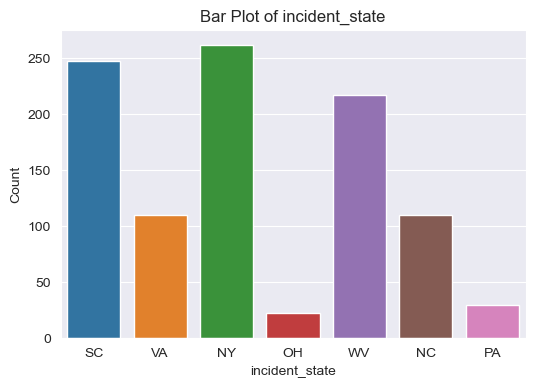

In [60]:
# Let's visualize the 'incident_state' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='incident_state', data=df)
plt.xlabel('incident_state')
plt.ylabel('Count')
plt.title('Bar Plot of incident_state')
plt.show()

Here we can see the NY has the highest count as it is the most frequent incident state.

13. 'incident_city'

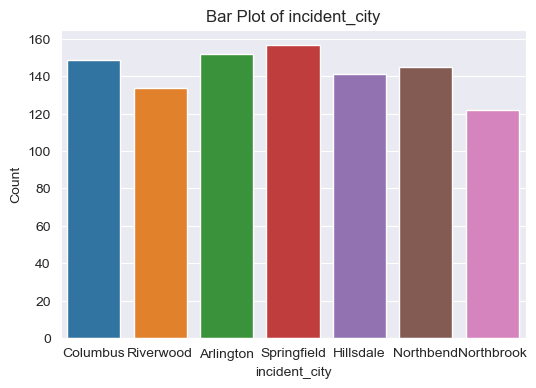

In [61]:
# Let's visualize the 'incident_city' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='incident_city', data=df)
plt.xlabel('incident_city')
plt.ylabel('Count')
plt.title('Bar Plot of incident_city')
plt.show()

Here we can see Springfield has the highest count as the frequent incident occur in this city.

14. 'property_damage'

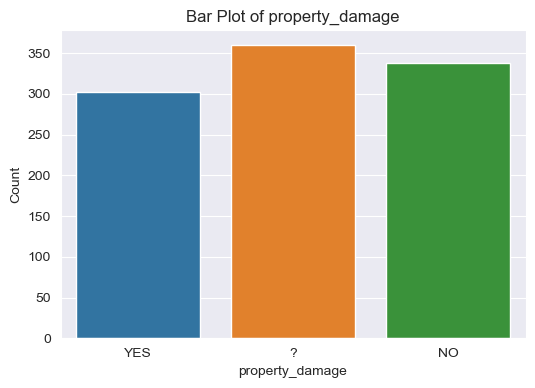

In [62]:
# Let's visualize the 'property_damage' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='property_damage', data=df)
plt.xlabel('property_damage')
plt.ylabel('Count')
plt.title('Bar Plot of property_damage')
plt.show()

Here we can see '?' has the highest count as either property damaged or not is not clear in most cases.

15. 'police_report_available'

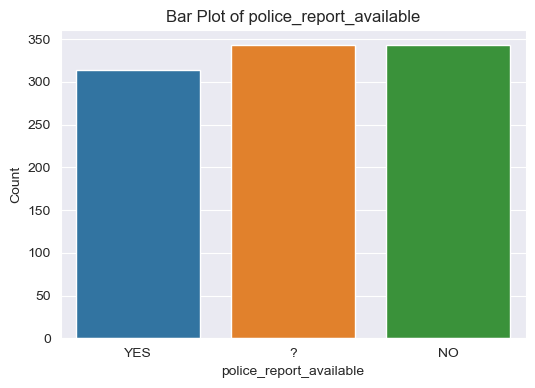

In [63]:
# Let's visualize the 'police_report_available' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='police_report_available', data=df)
plt.xlabel('police_report_available')
plt.ylabel('Count')
plt.title('Bar Plot of police_report_available')
plt.show()

Here too we can see the not clear has the highest count.

16. 'auto_make'

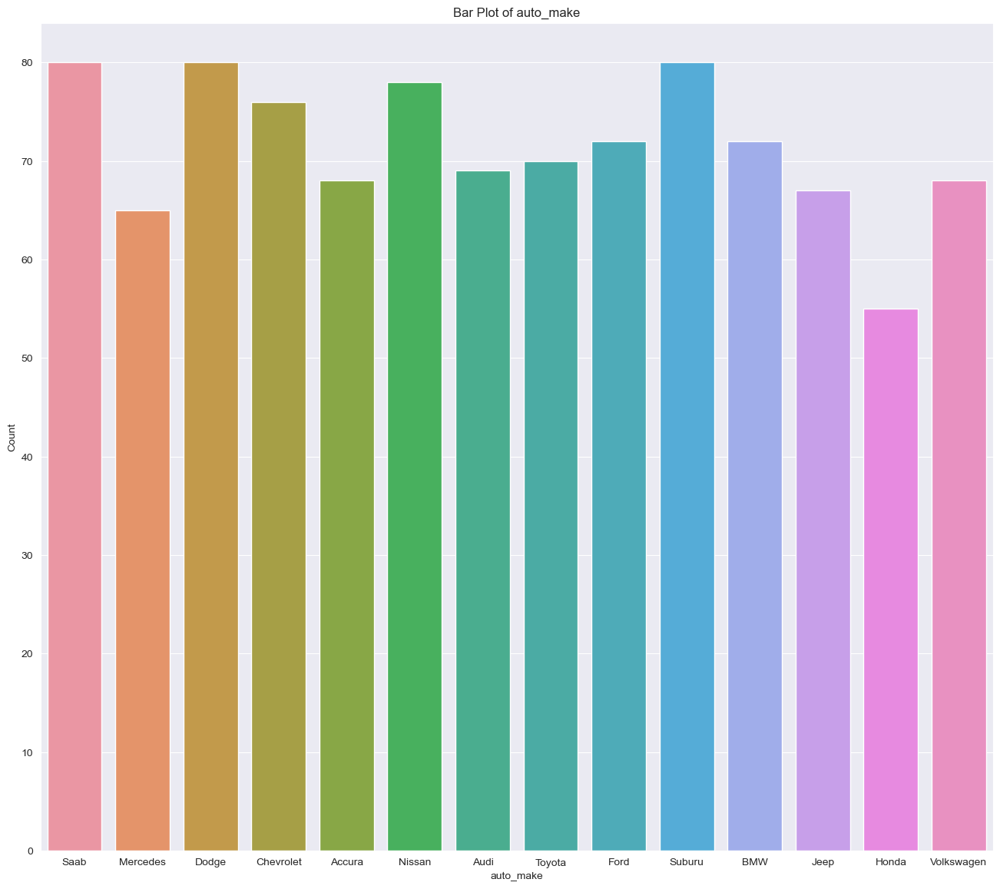

In [64]:
# Let's visualize the 'auto_make' column by bar plot

plt.figure(figsize=(16,14))
sns.countplot(x='auto_make', data=df)
plt.xlabel('auto_make')
plt.ylabel('Count')
plt.title('Bar Plot of auto_make')
plt.show()

Here we can see count of Saab,Dodge, and Suburu is the highest.

17. 'auto_model'

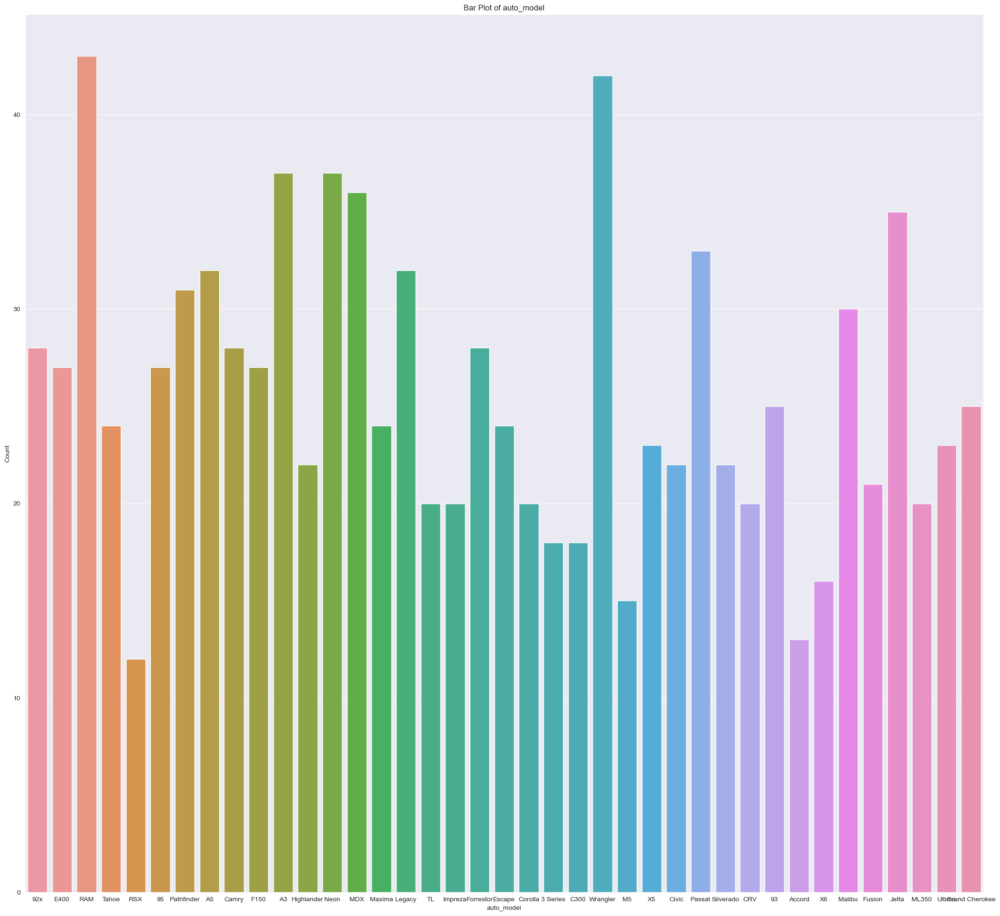

In [65]:
# Let's visualize the 'auto_model' column by bar plot

plt.figure(figsize=(26,24))
sns.countplot(x='auto_model', data=df)
plt.xlabel('auto_model')
plt.ylabel('Count')
plt.title('Bar Plot of auto_model')
plt.show()

18. 'fraud_reported'

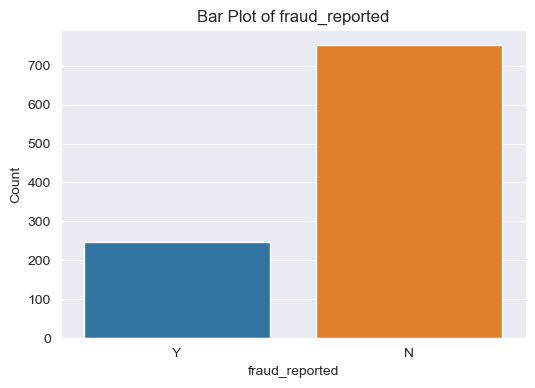

In [66]:
# Let's visualize the 'fraud_reported' column by bar plot

plt.figure(figsize=(6,4))
sns.countplot(x='fraud_reported', data=df)
plt.xlabel('fraud_reported')
plt.ylabel('Count')
plt.title('Bar Plot of fraud_reported')
plt.show()

Here we can see count of no fraud reported is quite high then yes reported.

# Bivariate Analysis

Here we will be using barplot and stacked bar plot to visualize relation between two variables.

1. 'fraud_reported' vs 'total_claim_amount' Columns

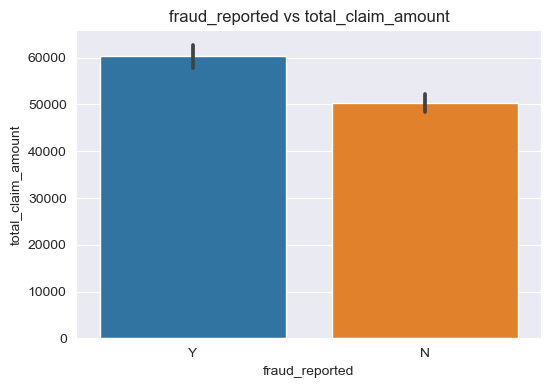

In [67]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'fraud_reported', y= 'total_claim_amount')
plt.xlabel('fraud_reported')
plt.ylabel('total_claim_amount')
plt.title('fraud_reported vs total_claim_amount')
plt.show()

Here we can see higher the total claim amount more fraud reported.

2. 'fraud_reported' vs 'policy_deductable' Columns

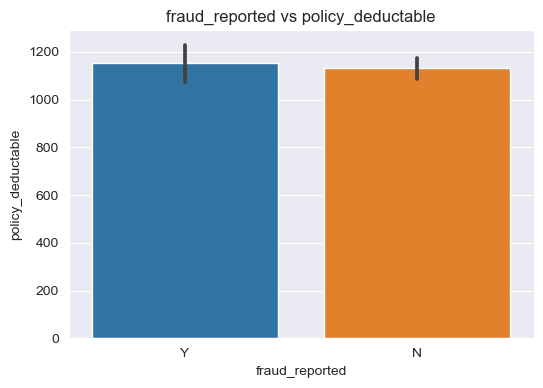

In [68]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'fraud_reported', y= 'policy_deductable')
plt.xlabel('fraud_reported')
plt.ylabel('policy_deductable')
plt.title('fraud_reported vs policy_deductable')
plt.show()

Here too we can see,higher the policy deductable amount more is the fraud reported.

3. 'fraud_reported' vs 'policy_annual_premium'

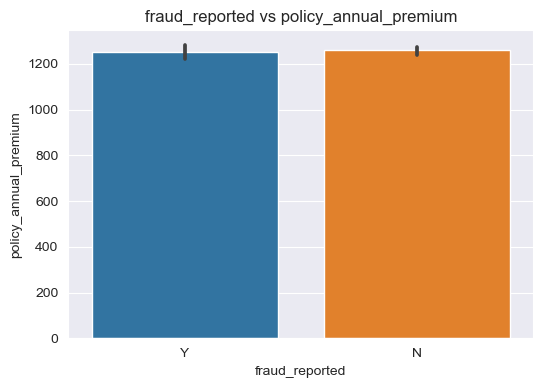

In [69]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'fraud_reported', y= 'policy_annual_premium')
plt.xlabel('fraud_reported')
plt.ylabel('policy_annual_premium')
plt.title('fraud_reported vs policy_annual_premium')
plt.show()

Here plot suggest that their is slight variation in fraud reported as no has slight higher bar.

4. 'fraud_reported' vs 'incident_type'

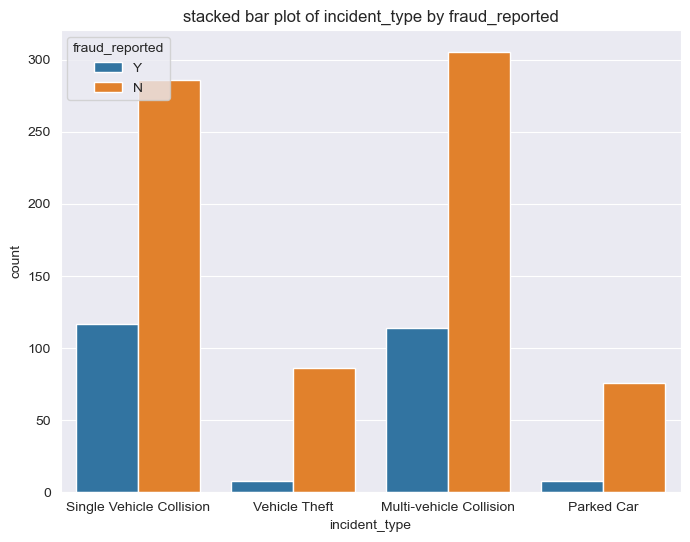

In [70]:
plt.figure(figsize= (8,6))
sns.countplot(data=df, x= 'incident_type', hue= 'fraud_reported')
plt.xlabel('incident_type')
plt.ylabel('count')
plt.title('stacked bar plot of incident_type by fraud_reported')
plt.legend(title= 'fraud_reported', loc= 'upper left')
plt.show()

Count for no fraud reported is more in each incident type.

5. 'fraud_reported' vs 'incident_severity'

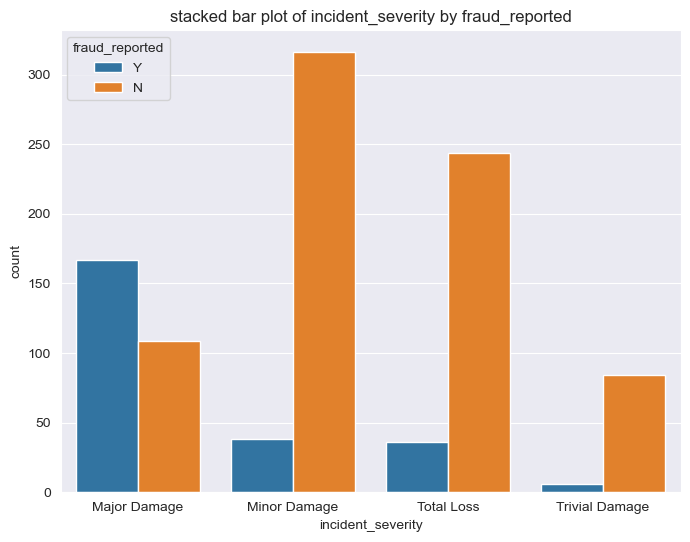

In [71]:
plt.figure(figsize= (8,6))
sns.countplot(data=df, x= 'incident_severity', hue= 'fraud_reported')
plt.xlabel('incident_severity')
plt.ylabel('count')
plt.title('stacked bar plot of incident_severity by fraud_reported')
plt.legend(title= 'fraud_reported', loc= 'upper left')
plt.show()

Count of yes fraud reported is only high in major damage, in rest no fraud reported is on high side.

6. 'fraud_reported' vs 'insured_occupation'

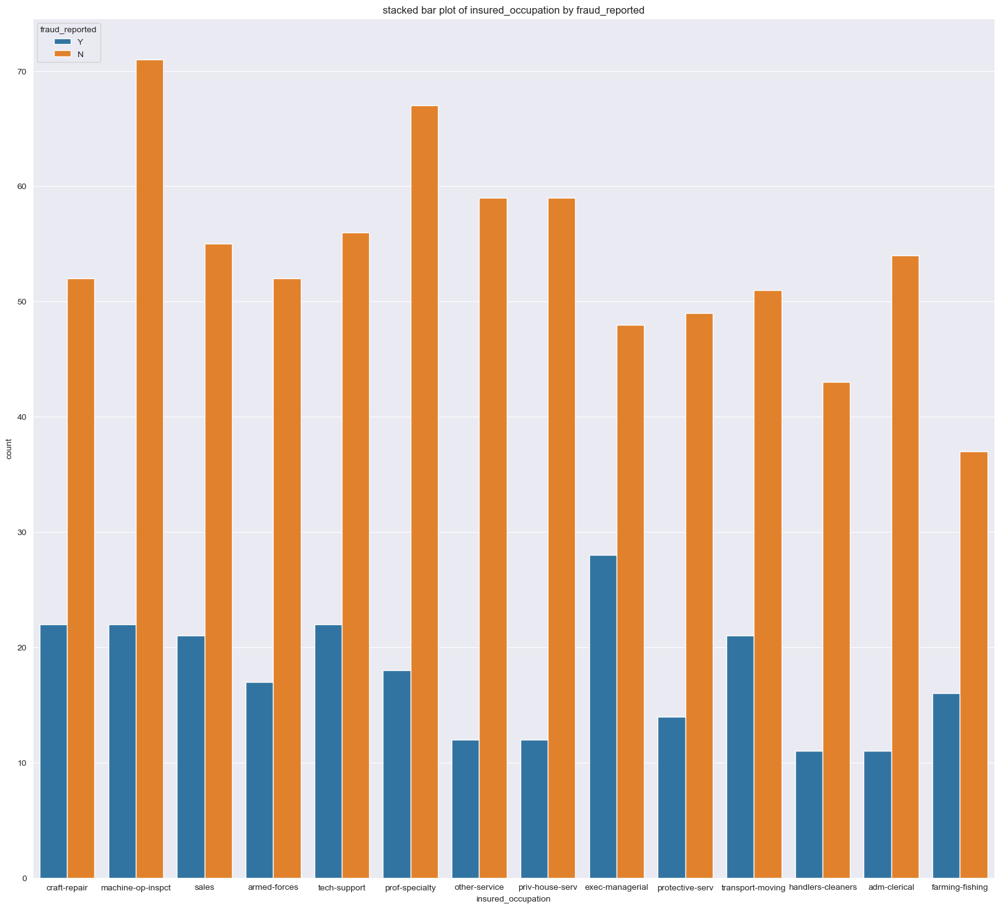

In [72]:
plt.figure(figsize= (20,18))
sns.countplot(data=df, x= 'insured_occupation', hue= 'fraud_reported')
plt.xlabel('insured_occupation')
plt.ylabel('count')
plt.title('stacked bar plot of insured_occupation by fraud_reported')
plt.legend(title= 'fraud_reported', loc= 'upper left')
plt.show()

Here too in each insured occupation no fraud reported count is on higher side that yes fraud reported.

8. 'fraud_reported' vs 'property_damage'

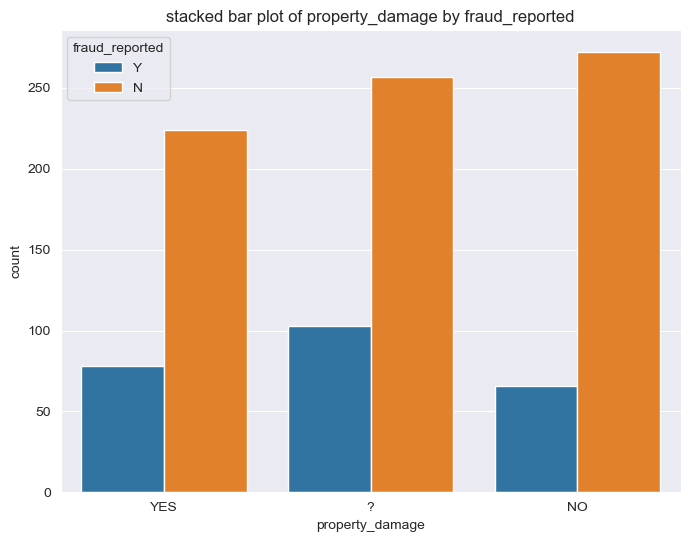

In [73]:
plt.figure(figsize= (8,6))
sns.countplot(data=df, x= 'property_damage', hue= 'fraud_reported')
plt.xlabel('property_damage')
plt.ylabel('count')
plt.title('stacked bar plot of property_damage by fraud_reported')
plt.legend(title= 'fraud_reported', loc= 'upper left')
plt.show()

Here too no fraud reported is on higher side of every possible option of property damage.

Multivariate Analysis

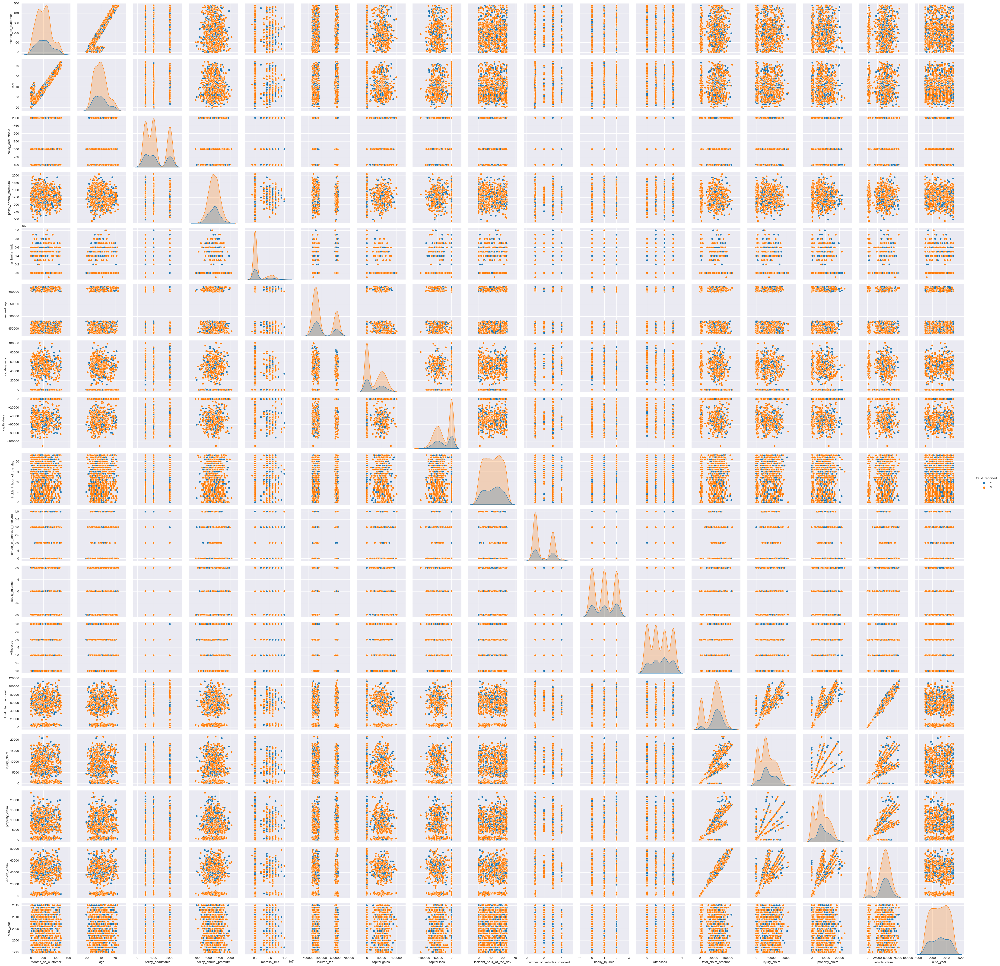

In [74]:
# Using pairplot

sns.pairplot(data= df, hue= 'fraud_reported')
plt.show()

# Data Preprocessing

Here in this preprocessing step, we will be checking data with outliers, skewness , and will handle them using the different or suitable required technique. We will be encoding categorical columns so that it will be easy for prediction. After that we will check the correlation and will do some feature engineering to know the suitable features for predictions and visualize that by using heatmap.

# Outliers

Here first we will check all the numerical columns to check the presence of outliers there and then will proceed with handling them either by treating them or by removing them.

We will be using winsorizing method first to treat outliers and then will be using clip() function to limit the extreme values. By cliping these extreme values we will be setting boundaries to prevent extremely high or low values from skewing the data for analysisresults. This will help us here to mitigate the impact of outliers and extreme observations on the analysis and avoid causing data loss.

For this we will be importing necessary library first from scipy.stats.mstats

Winsorizing Method: Winsorizing is a data transformation technique used to handle outliers or extreme values in a dataset. It involves replacing extreme values with less extreme values, thereby reducing the impact of outliers on statistical analysis. In winsorizing, we will be trimming or censoring the extreme values by replacing them with the value which is closer to rest of the data. It helps in reducoing the impact of outliers on the statistical measures and provides a more robust analysis.It ensures that extreme values do not unduly influence the results or skew the distribution of the data.

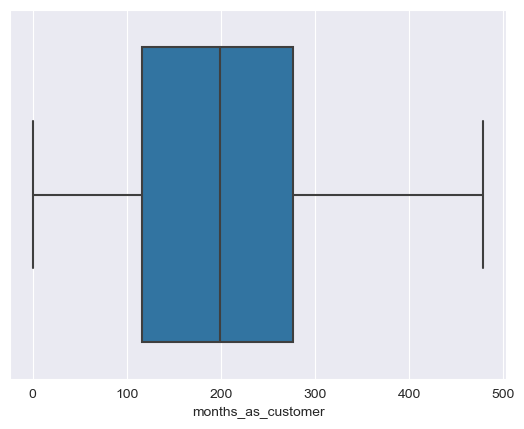

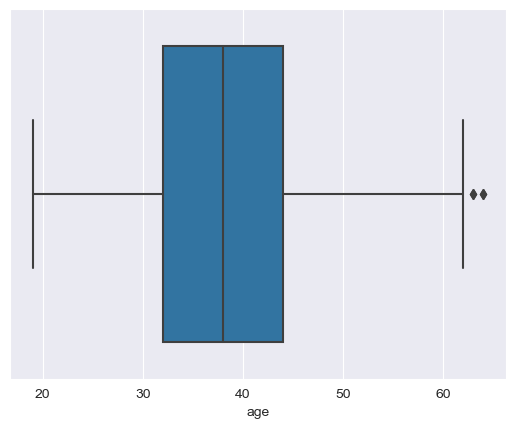

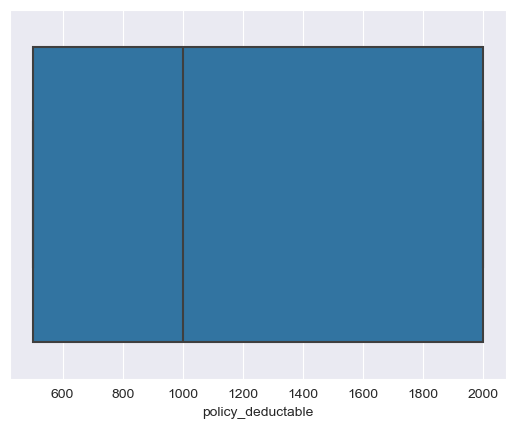

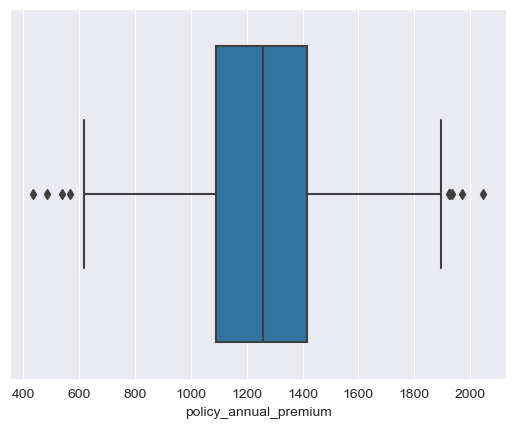

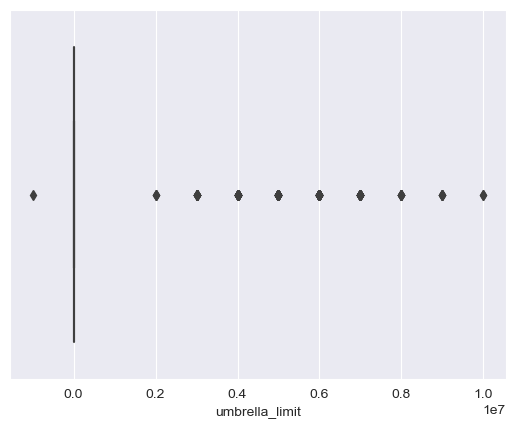

...

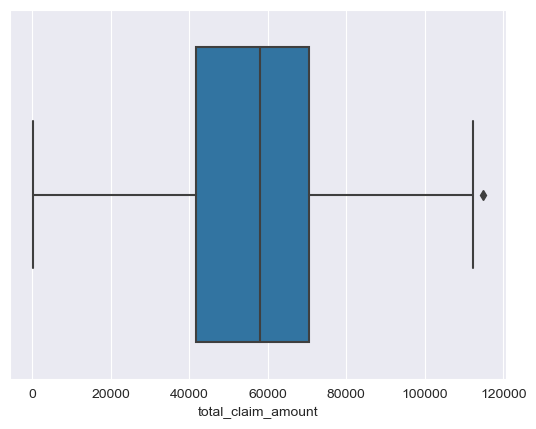

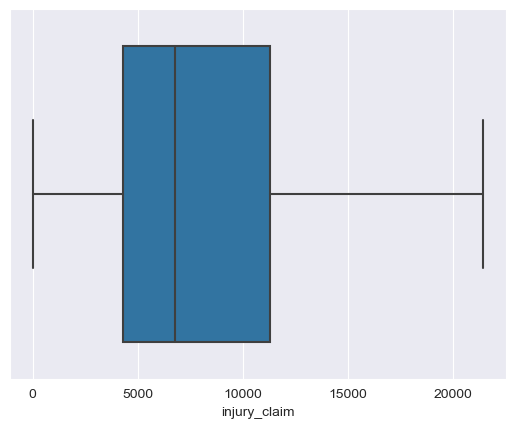

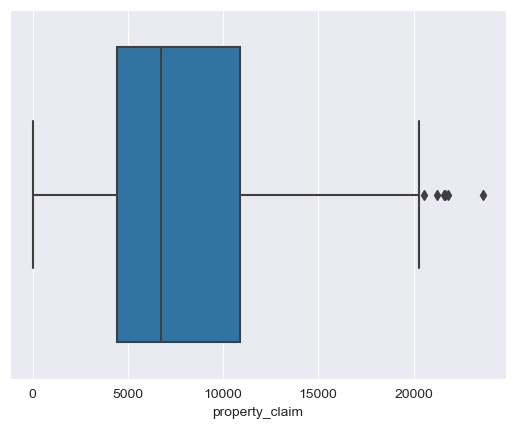

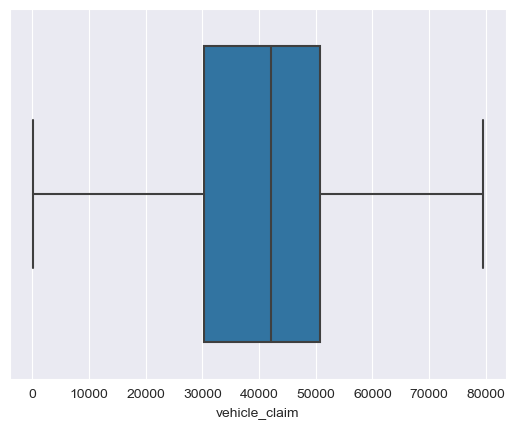

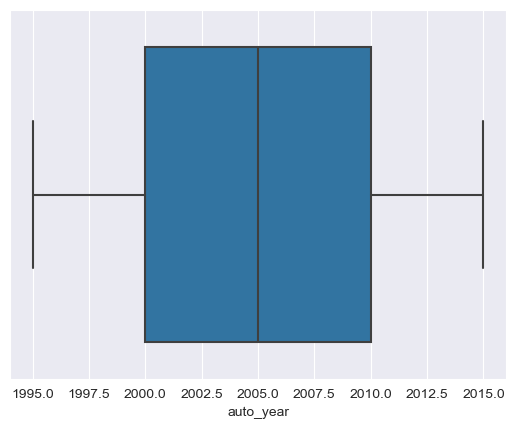

In [75]:
# Check the outliers

numerical_columns = ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']

for column in numerical_columns:
    sns.boxplot(x=df[column])
    plt.show()

In [76]:
from scipy.stats.mstats import winsorize

# Winsorize all numerical columns
num_cols = df.select_dtypes(include=np.number).columns.tolist()
df[num_cols] = df[num_cols].apply(lambda x: winsorize(x, limits=[0.05, 0.05]), axis=0)

# Clip extreme values
clip_values = df[num_cols].quantile([0.01, 0.99])
df[num_cols] = df[num_cols].clip(lower=clip_values.loc[0.01], upper=clip_values.loc[0.99], axis=1)

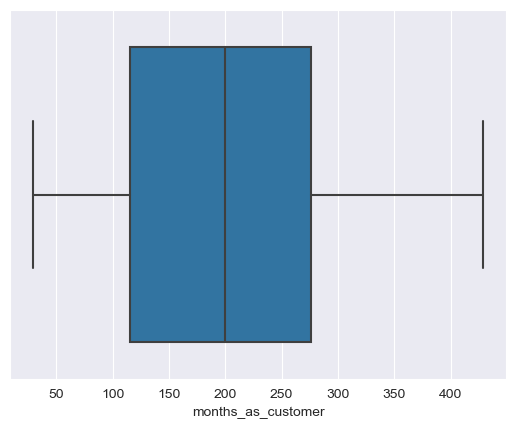

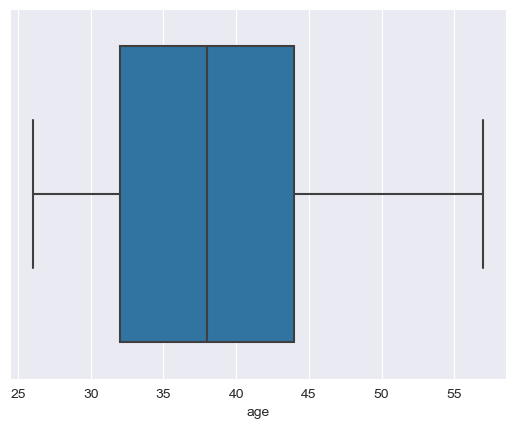

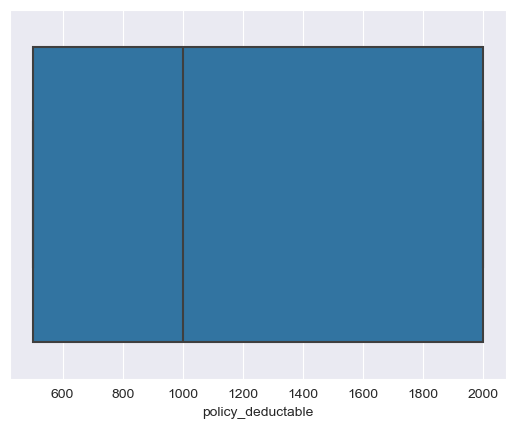

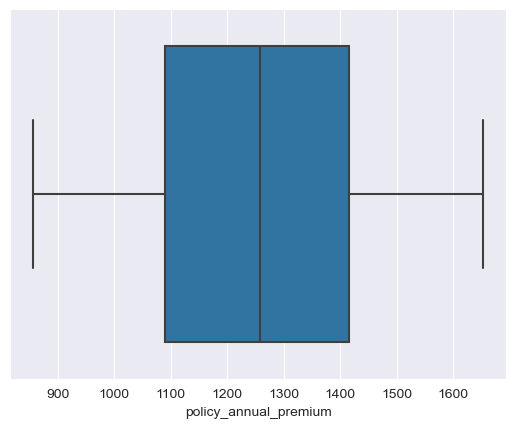

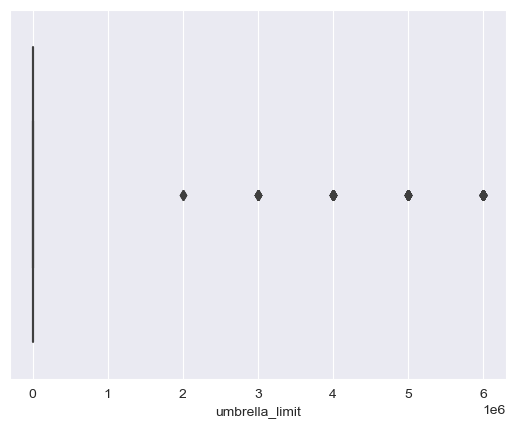

...

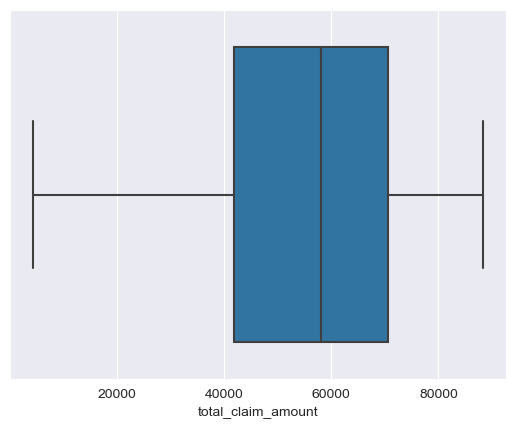

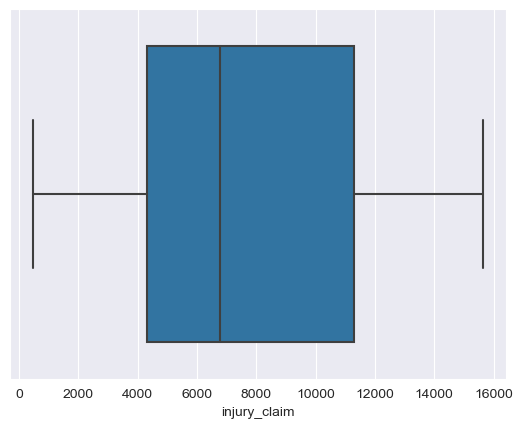

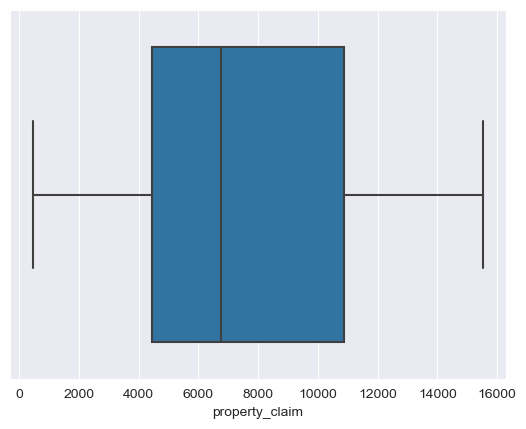

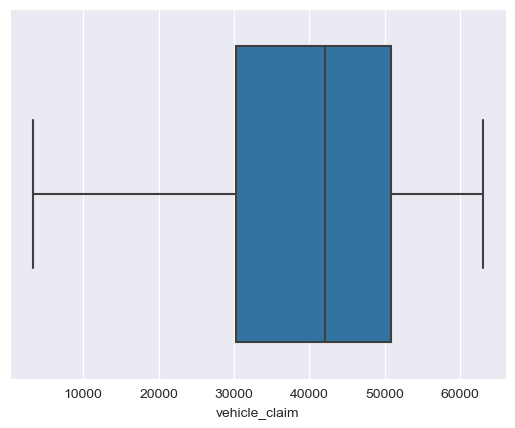

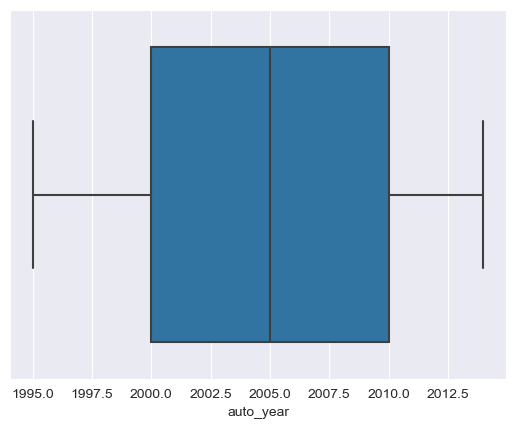

In [77]:
# Check the outliers again after treatment

numerical_columns = ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']

for column in numerical_columns:
    sns.boxplot(x=df[column])
    plt.show()

In [78]:
from scipy import stats
from scipy.stats import zscore

z_threshold = 3

# Clculate z-score for numerical columns
columns= ['umbrella_limit']
z_scores= stats.zscore(df[columns])

# Identify and remove the outliers
outlier_indices= (np.abs(z_scores)> z_threshold).any(axis=1)
df= df[~outlier_indices]

In [79]:
df.shape

(1000, 35)

As we have handled outliers possible and clipped the extreme value.

# Skewness

Here we will be checking for skewness and those values which are not in the range of -0.5 to +0.5, will be handling them.

We will be using Yeo-johnson transformation technique to handle the skewness in the column.

Yeo-Johnson transformation: It is a statistical measure and a power transformation technique used to transform a non-normal distribution into a distribution that closely resembles a normal distribution. It is a extension to Boxcox transformation. It involves applying power transformation to the original data. It helps in improving the model's performance. Implementing the Yeo-Johnson transformation in Python can be done using libraries such as SciPy or scikit-learn, using 'from sklearn.preprocessing import PowerTransformer' .

In [80]:
df.skew()

months_as_customer             0.317633
age                            0.428099
policy_deductable              0.477887
policy_annual_premium         -0.014447
umbrella_limit                 1.644112
insured_zip                    0.817735
capital-gains                  0.385772
capital-loss                  -0.299766
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.391718
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.717817
injury_claim                   0.155996
property_claim                 0.160191
vehicle_claim                 -0.742900
auto_year                     -0.085930
dtype: float64

In [81]:
from sklearn.preprocessing import PowerTransformer

# Define columns to transform
columns = ['umbrella_limit', 'insured_zip', 'total_claim_amount', 'vehicle_claim']
# Apply Yeo-Johnson transformation to selected columns
pt = PowerTransformer(method='yeo-johnson')
df[columns] = pt.fit_transform(df[columns])

# Round transformed values to 2 decimal places
df[columns] = df[columns].round(2)

df.skew()

months_as_customer             0.317633
age                            0.428099
policy_deductable              0.477887
policy_annual_premium         -0.014447
umbrella_limit                 1.494452
insured_zip                    0.000000
capital-gains                  0.385772
capital-loss                  -0.299766
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.391718
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.564495
injury_claim                   0.155996
property_claim                 0.160191
vehicle_claim                 -0.577410
auto_year                     -0.085930
dtype: float64

Skewness is handled possibly. And we will drop insured_zip column as it shows no relevance.

In [82]:
df= df.drop(['insured_zip'], axis=1)

# Encoding Categorical Columns

In [83]:
from sklearn.preprocessing import LabelEncoder

# Get all categorical columns
cat_columns = df.select_dtypes(include=['object']).columns.tolist()

# Initialize LabelEncoder
le = LabelEncoder()

# Apply LabelEncoder to each categorical column
for col in cat_columns:
    df[col] = le.fit_transform(df[col])
    
df.dtypes    

months_as_customer               int64
age                              int64
policy_state                     int64
policy_csl                       int64
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                 float64
insured_sex                      int64
insured_education_level          int64
insured_occupation               int64
insured_hobbies                  int64
insured_relationship             int64
capital-gains                    int64
capital-loss                     int64
incident_type                    int64
collision_type                   int64
incident_severity                int64
authorities_contacted            int64
incident_state                   int64
incident_city                    int64
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                  int64
bodily_injuries                  int64
witnesses                        int64
police_report_available  

In [84]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 34 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_state                 1000 non-null   int64  
 3   policy_csl                   1000 non-null   int64  
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   float64
 7   insured_sex                  1000 non-null   int64  
 8   insured_education_level      1000 non-null   int64  
 9   insured_occupation           1000 non-null   int64  
 10  insured_hobbies              1000 non-null   int64  
 11  insured_relationship         1000 non-null   int64  
 12  capital-gains                1000 non-null   int64  
 13  capital-loss       

# Correlation between Target And Independent Variable

Now here, we will be checking the correlation matrix which shows the relation between target and independent variable. We will get it by using df.corr() function. We will be finding the correlation to know which feature is more positive or negatively correlated to the target vaiable, which will be helping us for the feature selction to avoid overfitting. We will also be visualizing this correlation with using heatmap. And will be using seaborn library for heatmap.

In [85]:
# Let's check correlation

pd.set_option('display.max_columns', None)
df.corr()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
months_as_customer,1.000000,0.923894,0.000633,-0.025253,0.027628,0.008714,0.004529,0.062779,-0.001845,0.012421,-0.095782,0.070745,0.003087,0.015447,-0.015749,-0.017075,-0.056006,0.011138,0.004146,0.003350,0.073234,0.015313,0.006915,-0.010668,0.058963,0.016699,0.058091,0.067613,0.041789,0.057754,0.046566,0.000594,0.002826,0.021182
age,0.923894,1.000000,-0.014701,-0.011756,0.031119,0.019493,-0.002221,0.074593,-0.001111,0.017883,-0.080323,0.074113,-0.012485,0.001741,-0.024120,-0.015409,-0.055514,0.020901,0.001852,-0.000833,0.093722,0.023335,0.000611,-0.018663,0.046665,0.012337,0.068007,0.077244,0.064488,0.061026,0.026087,0.017964,0.003254,0.012036
policy_state,0.000633,-0.014701,1.000000,0.001027,0.010033,0.015813,-0.017468,-0.020481,-0.034327,-0.031215,-0.038689,-0.018506,0.074463,-0.030162,0.031848,0.034739,-0.026377,-0.016777,0.008723,-0.002077,0.029457,-0.039028,0.008623,0.013384,0.022960,0.071950,-0.009496,-0.043609,0.007858,-0.002826,0.017124,-0.025253,0.002477,0.029432
policy_csl,-0.025253,-0.011756,0.001027,1.000000,0.003384,0.020502,0.015047,-0.010757,0.009153,0.015788,-0.005960,-0.030063,0.006715,-0.034246,0.011997,-0.036687,0.022530,0.056182,0.032814,0.009333,-0.001869,-0.021123,-0.027340,-0.000595,0.071500,0.002424,-0.053666,-0.077185,-0.047136,-0.041556,-0.004701,0.047885,-0.032930,-0.037190
policy_deductable,0.027628,0.031119,0.010033,0.003384,1.000000,0.006319,-0.001371,-0.009733,0.015217,-0.046733,0.004061,-0.022945,0.033017,-0.022987,-0.038411,-0.033182,-0.015711,-0.000760,0.006517,-0.045117,0.060935,0.054357,0.016900,-0.022765,0.066639,0.030166,0.023848,0.035220,0.067745,0.006803,-0.035379,-0.003268,0.025574,0.014817
policy_annual_premium,0.008714,0.019493,0.015813,0.020502,0.006319,1.000000,0.000659,0.039255,-0.019388,0.029379,-0.022054,0.007814,-0.017055,0.029575,0.050469,0.029885,-0.012330,-0.053077,0.041120,0.056571,-0.000985,-0.043398,0.097205,0.019900,0.006444,0.018247,0.002300,-0.021832,-0.007892,0.011825,0.008616,-0.032692,-0.031691,-0.016872
umbrella_limit,0.004529,-0.002221,-0.017468,0.015047,-0.001371,0.000659,1.000000,0.014698,-0.016869,0.019100,-0.032530,0.092651,-0.041689,-0.014947,0.026382,-0.011420,0.000043,0.026777,-0.070223,0.008346,-0.017039,-0.029469,-0.059471,0.050557,-0.010979,-0.055976,-0.035324,-0.039634,-0.015111,-0.033856,0.008820,0.027818,0.005775,0.059903
insured_sex,0.062779,0.074593,-0.020481,-0.010757,-0.009733,0.039255,0.014698,1.000000,0.009002,-0.006160,-0.020317,0.002855,-0.019014,-0.021901,0.009952,-0.023310,-0.028168,0.017914,-0.022379,0.014470,0.019290,0.014317,0.029293,-0.020297,0.042463,0.020864,-0.019946,-0.000121,-0.013864,-0.028438,0.026457,-0.018421,-0.027329,0.030873
insured_education_level,-0.001845,-0.001111,-0.034327,0.009153,0.015217,-0.019388,-0.016869,0.009002,1.000000,-0.020298,0.021807,-0.023488,0.041477,0.042237,0.013704,0.026390,-0.006420,-0.010838,-0.005903,-0.018636,-0.057061,-0.002407,-0.025290,-0.012072,0.019211,0.036141,0.073164,0.080292,0.058168,0.070398,0.055202,0.049445,0.042531,0.008808
insured_occupation,0.012421,0.017883,-0.031215,0.015788,-0.046733,0.029379,0.019100,-0.006160,-0.020298,1.000000,-0.011077,-0.010171,-0.002139,-0.018695,0.003842,0.006111,0.004731,-0.007811,-0.022761,0.000390,-0.018435,-0.015108,0.010697,-0.000236,-0.014794,-0.011083,0.005347,0.019705,0.002697,0.001303,0.042621,0.020584,-0.004216,0.001564


In [86]:
correlation_matrix= df.corr()
fraud_reported_correlation= correlation_matrix['fraud_reported']
print(fraud_reported_correlation)

months_as_customer             0.021182
age                            0.012036
policy_state                   0.029432
policy_csl                    -0.037190
policy_deductable              0.014817
policy_annual_premium         -0.016872
umbrella_limit                 0.059903
insured_sex                    0.030873
insured_education_level        0.008808
insured_occupation             0.001564
insured_hobbies               -0.046838
insured_relationship           0.021043
capital-gains                 -0.022084
capital-loss                  -0.017732
incident_type                 -0.050376
collision_type                 0.110130
incident_severity             -0.405988
authorities_contacted         -0.045802
incident_state                -0.051407
incident_city                 -0.040403
incident_hour_of_the_day       0.004316
number_of_vehicles_involved    0.046625
property_damage               -0.030497
bodily_injuries                0.033877
witnesses                      0.049497


In [87]:
df= df.drop(['auto_model'], axis = 1)

# Visualization of Correlation-Matrix 

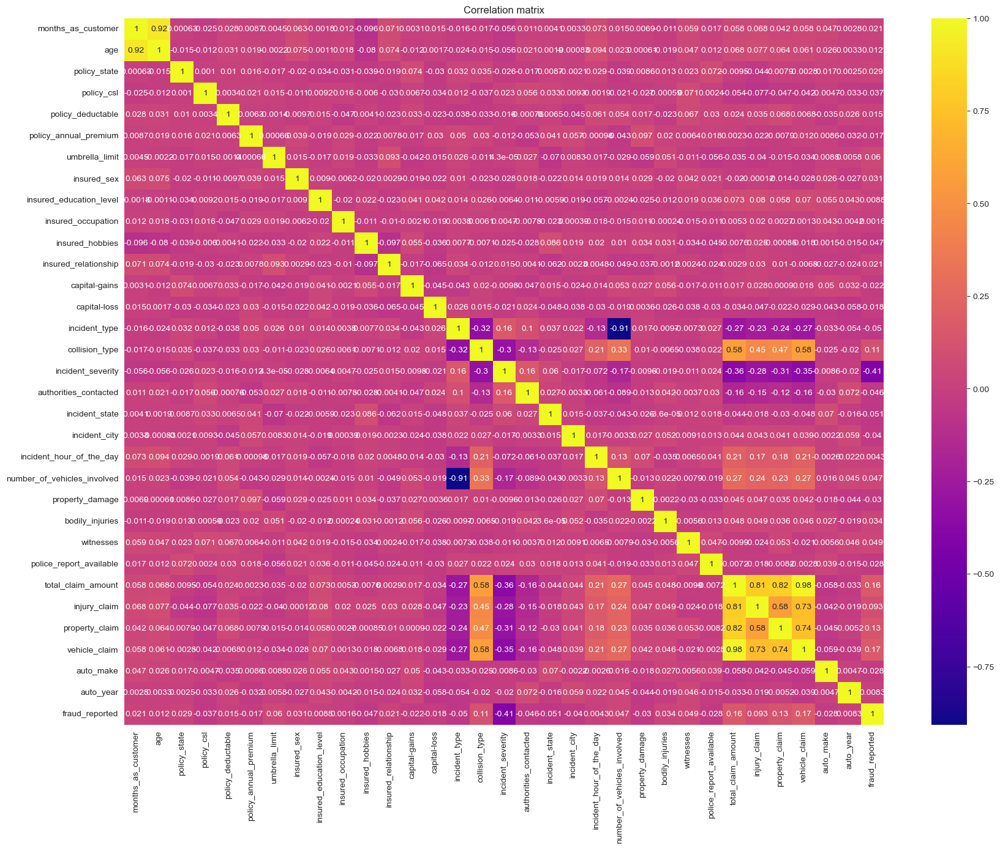

In [88]:
# Let's visualize the relation by using heatmap

correlation_matrix = df.corr()

plt.figure(figsize=(20,15))
sns.heatmap(correlation_matrix, annot=True, cmap='plasma')
plt.title('Correlation matrix')
plt.show()

# Feature Engineering

Now we will be defining the target and independent variable, so that it will be clear what to predict on what basis. Then we will proceed with the feature scaling process using MinMaxScaler from sklearn.preprocessing.

Feature Scaling: It is performed to bring all the features to a similar scale or value range. It basically helps in improving the performance, convergence, and interpretability of ML algorithm. It ensures that all features should be treated equally during the modeling.

MinMaxScaler: This technique used to transform features by scaling them to a specified range which should be between 0-1. It ensures that all features are scaled proportionally. This technique is useful to preserve the shape of the original distribution while bringing all features to a common scale.

After this we will proceed with checking out for multicollinearity by finding the vif(variation inflation factor) values. For this we will be importing statsmodels.api and then from statsmodels.stats.outliers_inflation importing variance_inflation_factor to find out the vif values for the features.

A vif value 1 indicates no multicollinearity, while values greater than 1 suggest increasing multicollinearity. Generally , vif value above 5 or 10 is considered very high, so in that case we need to handle the multicollinearity.

If we will find any value above range we will be handling that by dropping one or two column with high multicollinearity, an will also be adding constant term for calculating vif. A constant term will allow and help us for a more accurate assessment of multicollinearity and its impact on predictor variable.

After handling multicollinearity issue, we will proceed with finding the Best Random State, which will ensure that further operations should be reproducible. Here we will be using logistic regression algorithm for classification tasks to generate the best random state. The genrated best random score by this alogorithm should be used in all further runs for results reproducibility.

We will have to balance the target variable if there is any imbalance, and in that case we will be using RandomOverSampler technique.

Now we will be spliting the data into train and test so that we can train models on train data and can check its performance on test data. As We have a limited observation so, we will be taking "test size- 0.2", rest will be used as train data to train the model.

# Target and Independent Variable

In [89]:
# Define Target and Independent Variable

y = df['fraud_reported']
X = df.drop('fraud_reported', axis=1)

print("Target variable name: ", y.name)
print("Target variable dimensions: ", y.shape)

print("\nFeatures variables names: ", list(X.columns))
print("Features variables dimensions: ", X.shape)

Target variable name:  fraud_reported
Target variable dimensions:  (1000,)

Features variables names:  ['months_as_customer', 'age', 'policy_state', 'policy_csl', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'capital-gains', 'capital-loss', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'property_damage', 'bodily_injuries', 'witnesses', 'police_report_available', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make', 'auto_year']
Features variables dimensions:  (1000, 32)


# Feature Selection

In [90]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

y = df['fraud_reported']
X = df.drop('fraud_reported', axis=1)

# Initialize the model
model= LogisticRegression()

# Initialize the RFE selector with model
rfe= RFE(model, n_features_to_select=5)

# Fit the selctor on data
rfe.fit(X,y)

# Get the selected features
selected_features = X.columns[rfe.support_]

# Print the features
print(selected_features)

Index(['umbrella_limit', 'incident_severity', 'witnesses',
       'total_claim_amount', 'vehicle_claim'],
      dtype='object')


In [91]:
fit_score = rfe.ranking_
print(fit_score)
# Get the column names of all features
all_columns = X.columns
feature_rankings = pd.DataFrame({'Feature': all_columns, 'Ranking': fit_score})

# Sort the features based on their rankings (lower rank indicates higher importance)
feature_rankings = feature_rankings.sort_values('Ranking')

print(feature_rankings)

[19 18  5  6 24 21  1  4 28 26 14 16 25 27  3 13  1 12 11  9 17  2  7  8
  1 10  1 23 22  1 15 20]
                        Feature  Ranking
29                vehicle_claim        1
26           total_claim_amount        1
6                umbrella_limit        1
24                    witnesses        1
16            incident_severity        1
21  number_of_vehicles_involved        2
14                incident_type        3
7                   insured_sex        4
2                  policy_state        5
3                    policy_csl        6
22              property_damage        7
23              bodily_injuries        8
19                incident_city        9
25      police_report_available       10
18               incident_state       11
17        authorities_contacted       12
15               collision_type       13
10              insured_hobbies       14
30                    auto_make       15
11         insured_relationship       16
20     incident_hour_of_the_day       17

In [92]:
X = X.drop(['insured_education_level', 'capital-loss', 'insured_occupation'], axis=1)

# Feature Scaling

In [93]:
from sklearn.preprocessing import MinMaxScaler

# Initialize scaler
scaler = MinMaxScaler()

# Apply to all columns
X_scaled = scaler.fit_transform(X)

# Create a new dataframe with the scaled features
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)
print(X_scaled_df)

     months_as_customer       age  policy_state  policy_csl  \
0                0.7475  0.709677           1.0         0.5   
1                0.4975  0.516129           0.5         0.5   
2                0.2625  0.096774           1.0         0.0   
3                0.5675  0.483871           0.0         0.5   
4                0.4975  0.580645           0.0         1.0   
..                  ...       ...           ...         ...   
995              0.0000  0.387097           1.0         1.0   
996              0.6400  0.483871           0.0         0.0   
997              0.2525  0.258065           1.0         0.5   
998              1.0000  1.000000           0.0         1.0   
999              1.0000  1.000000           1.0         0.5   

     policy_deductable  policy_annual_premium  umbrella_limit  insured_sex  \
0             0.333333               0.691285             0.0          1.0   
1             1.000000               0.428575             1.0          1.0   
2        

# Variance Inflation Factor(VIF)

In [94]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

# add a constant column to features
X_scaled_df = sm.add_constant(X_scaled_df)

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["X"] = X_scaled_df.columns
vif["VIF"] = [variance_inflation_factor(X_scaled_df.values, i) for i in range(X_scaled_df.shape[1])]

# Print the VIF dataframe
print(vif)

                              X         VIF
0                         const   64.340524
1            months_as_customer    7.038618
2                           age    7.032061
3                  policy_state    1.026457
4                    policy_csl    1.023094
5             policy_deductable    1.034493
6         policy_annual_premium    1.031996
7                umbrella_limit    1.030342
8                   insured_sex    1.025099
9               insured_hobbies    1.045308
10         insured_relationship    1.037698
11                capital-gains    1.028813
12                incident_type    5.763189
13               collision_type    1.683348
14            incident_severity    1.199658
15        authorities_contacted    1.072753
16               incident_state    1.034894
17                incident_city    1.020183
18     incident_hour_of_the_day    1.095113
19  number_of_vehicles_involved    5.802232
20              property_damage    1.032916
21              bodily_injuries 

In [95]:
X_scaled = X_scaled_df.drop(['property_claim', 'injury_claim', 'age'], axis=1)

In [96]:
X_scaled['const']=1

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["X"] = X_scaled.columns
vif["VIF"] = [variance_inflation_factor(X_scaled.values, i) for i in range(X_scaled.shape[1])]

# Print the VIF dataframe
print(vif)

                              X        VIF
0                         const  64.263768
1            months_as_customer   1.040189
2                  policy_state   1.022612
3                    policy_csl   1.021213
4             policy_deductable   1.032419
5         policy_annual_premium   1.030044
6                umbrella_limit   1.028683
7                   insured_sex   1.021155
8               insured_hobbies   1.044087
9          insured_relationship   1.036475
10                capital-gains   1.026900
11                incident_type   5.761109
12               collision_type   1.670004
13            incident_severity   1.198299
14        authorities_contacted   1.068515
15               incident_state   1.033658
16                incident_city   1.019925
17     incident_hour_of_the_day   1.089817
18  number_of_vehicles_involved   5.792755
19              property_damage   1.031776
20              bodily_injuries   1.023144
21                    witnesses   1.027625
22      pol

Almost VIF is handled, rest two is important feature for prediction.

# Value count of Target Variable

In [97]:
y.value_counts()

0    753
1    247
Name: fraud_reported, dtype: int64

# Best Random State

In [98]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Define the features and target variables
X = df.drop('fraud_reported', axis=1)
y = df['fraud_reported']

# Initialize variables to store the best accuracy score and corresponding random state
best_score = 0
best_state = 0

# Loop through different random states
for state in range(1, 101):
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=state)

    # Initialize the model
    lr = LogisticRegression()
    
    # Train the model on the training data
    lr.fit(X_train, y_train)
    
    # Test the model on the testing data and get the accuracy score
    lr_score = accuracy_score(y_test, lr.predict(X_test))
    
    # Get the maximum accuracy score and corresponding random state
    if lr_score > best_score:
        best_score = lr_score
        best_state = state
        best_model = 'Logistic Regression'
    
print(f'Best accuracy score: {best_score}')
print(f'Max random state: {best_state}')

Best accuracy score: 0.82
Max random state: 16


Best accuracy score is 0.82 at Max random state 16.

# Split the Data

In [99]:
# Split the data into test and train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=16)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(800, 32)
(200, 32)
(800,)
(200,)


# Oversampling

In [100]:
from imblearn.over_sampling import RandomOverSampler

# Define the target variable from the features
X = df.drop('fraud_reported', axis=1)
y = df['fraud_reported']

# Instantiate RandomOverSampler
ros = RandomOverSampler(random_state=0)

# Fit and resample the data
X_resampled, y_resampled = ros.fit_resample(X, y)

# Check the value counts of the resampled target variable
print(y_resampled.value_counts())

1    753
0    753
Name: fraud_reported, dtype: int64


# Modelling

Classification Algorithm:

Now we will be start modelling process which involve the train the model on training dataset and make it ready for testing or prediction phase. For modelling we will be using classification algorithm as this is the classification problem, where we have to predict the region.

We will be using different algorithms to check which one is performing best on both testing and test data depends on this specific dataset and make it ready for making prediction on unseen data. Algorithms will be used in this problems are: Logistic Regression will be importing from sklearn.linear_model, DecisionTreeClassifier will be importing from sklearn.tree, RandomForestClassifier,ExtraTreeClassifier, GradientBoostClassifier, AdaBoostClassifier, Bagging Classifier will be importing from sklearn.ensemble, GaussianNB will be importing from sklearn.naive_bayes, KNeighborsClassifier will be importing from sklearn.neighbors .

We will be train our model on each algorithms and will be evaluating the accuracy and the classification report. per On this basis we will first find out which one will be performing well, then further for more accuracy we will be finding out cross validation score and will find out the difference between the accuracy score and the CV score, lesser the difference accurate the performance, and finally we will be using hyperparameter tuning to hypertune the best three performing model base on lesser difference to check their performance. At last we will be saving that model for future prediction on unseen data.

We will be importing cross_val_score from sklearn.models_selection

# Logistic Regression(LR)

In [101]:
# Initialize and train model
model = LogisticRegression(random_state=16)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.82
Classification report: 
               precision    recall  f1-score   support

           0       0.82      1.00      0.90       164
           1       0.00      0.00      0.00        36

    accuracy                           0.82       200
   macro avg       0.41      0.50      0.45       200
weighted avg       0.67      0.82      0.74       200

Confusion matrix: 
 [[164   0]
 [ 36   0]]


Accuracy score of this model is 82%

# DecisionTreeClassification(DTC)

In [102]:
# Initialize and train model
model = DecisionTreeClassifier(random_state=16)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.795
Classification report: 
               precision    recall  f1-score   support

           0       0.91      0.84      0.87       164
           1       0.45      0.61      0.52        36

    accuracy                           0.80       200
   macro avg       0.68      0.72      0.69       200
weighted avg       0.82      0.80      0.81       200

Confusion matrix: 
 [[137  27]
 [ 14  22]]


Accuracy score of this model is 80% .

# RandomForestClassification(RFC)

In [103]:
# Initialize and Train the model
model = RandomForestClassifier(random_state= 16)
model.fit(X_train, y_train)

# Make prediction on test data
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.81
Classification report: 
               precision    recall  f1-score   support

           0       0.87      0.91      0.89       164
           1       0.46      0.36      0.41        36

    accuracy                           0.81       200
   macro avg       0.67      0.63      0.65       200
weighted avg       0.79      0.81      0.80       200

Confusion matrix: 
 [[149  15]
 [ 23  13]]


Accuracy score of this model is 81% .

# ExtraTreeClassification(ETC)

In [104]:
# Initialize and train model
model = ExtraTreesClassifier(random_state=16)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.785
Classification report: 
               precision    recall  f1-score   support

           0       0.84      0.91      0.87       164
           1       0.33      0.19      0.25        36

    accuracy                           0.79       200
   macro avg       0.59      0.55      0.56       200
weighted avg       0.75      0.79      0.76       200

Confusion matrix: 
 [[150  14]
 [ 29   7]]


Accuracy Score of this model is 79% .

# GradientBoostingClassification(GBC)

In [105]:
# Initialize and train model
model = GradientBoostingClassifier(random_state=16)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.85
Classification report: 
               precision    recall  f1-score   support

           0       0.93      0.88      0.91       164
           1       0.57      0.69      0.62        36

    accuracy                           0.85       200
   macro avg       0.75      0.79      0.77       200
weighted avg       0.86      0.85      0.86       200

Confusion matrix: 
 [[145  19]
 [ 11  25]]


Accuracy score of this model is 85% .

# AdaBoostClassification(ABC)

In [106]:
# Initialize and train model
model = AdaBoostClassifier(random_state=16)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.825
Classification report: 
               precision    recall  f1-score   support

           0       0.89      0.90      0.89       164
           1       0.52      0.47      0.49        36

    accuracy                           0.82       200
   macro avg       0.70      0.69      0.69       200
weighted avg       0.82      0.82      0.82       200

Confusion matrix: 
 [[148  16]
 [ 19  17]]


Accuracy score of this model is 82% .

# BaggingClassification

In [107]:
# Initialize and train model
model = BaggingClassifier(base_estimator=DecisionTreeClassifier(),
                          n_estimators=100, random_state=16)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.835
Classification report: 
               precision    recall  f1-score   support

           0       0.94      0.85      0.89       164
           1       0.53      0.75      0.62        36

    accuracy                           0.83       200
   macro avg       0.73      0.80      0.76       200
weighted avg       0.87      0.83      0.85       200

Confusion matrix: 
 [[140  24]
 [  9  27]]


Accuracy score of this model is 83% .

# KNeighborsClassification(KNN)

In [108]:
# Initialize and train model
model = KNeighborsClassifier(n_neighbors=5)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.75
Classification report: 
               precision    recall  f1-score   support

           0       0.82      0.89      0.85       164
           1       0.18      0.11      0.14        36

    accuracy                           0.75       200
   macro avg       0.50      0.50      0.50       200
weighted avg       0.71      0.75      0.72       200

Confusion matrix: 
 [[146  18]
 [ 32   4]]


Accuracy score of this model is 75% .

# SupportVectorClassification(SVC)

In [109]:
# Initialize and train model
model = SVC(kernel='linear', random_state=16)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.785
Classification report: 
               precision    recall  f1-score   support

           0       0.83      0.93      0.88       164
           1       0.27      0.11      0.16        36

    accuracy                           0.79       200
   macro avg       0.55      0.52      0.52       200
weighted avg       0.73      0.79      0.75       200

Confusion matrix: 
 [[153  11]
 [ 32   4]]


Accuracy score of this model is 79% .

# GaussianNB(Naive-Bayes)

In [110]:
# Initialize and train model
model = GaussianNB()
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.725
Classification report: 
               precision    recall  f1-score   support

           0       0.87      0.79      0.82       164
           1       0.31      0.44      0.37        36

    accuracy                           0.73       200
   macro avg       0.59      0.62      0.60       200
weighted avg       0.77      0.72      0.74       200

Confusion matrix: 
 [[129  35]
 [ 20  16]]


Accuracy score of this model is 73% .

According to modelling technique, GradientBoostingClassification shows highest accuracy of 85%.

# Cross Validation Score(CV Score)

# LR CV Score

In [111]:
# checking cv score for lr 
lr_cv = LogisticRegression()
lr_cv.fit(X_train, y_train)

lr_cv_score = cross_val_score(lr_cv, X_train, y_train, cv=5)
print("Cross Validation Score:", lr_cv_score)
print("Mean CV Score:", np.mean(lr_cv_score))

predlr_cv = lr_cv.predict(X_test)
print("Accuracy:", accuracy_score(y_test, predlr_cv))
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, predlr_cv) - np.mean(lr_cv_score))

Cross Validation Score: [0.7375  0.7375  0.7375  0.7375  0.73125]
Mean CV Score: 0.7362500000000001
Accuracy: 0.82
Difference between accuracy score and cross-validation score is: 0.08374999999999988


# DTC CV Score

In [112]:
model = DecisionTreeClassifier(random_state=16)

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.80625 0.80625 0.75    0.75625 0.74375]
Mean CV Score: 0.7725
Accuracy: 0.795
Difference between accuracy score and cross-validation score is: 0.022500000000000075


# RFC CV Score

In [113]:
model = RandomForestClassifier(n_estimators=100, random_state=16)

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)

# print the cross-validation scores and mean score
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.79375 0.78125 0.74375 0.75625 0.7375 ]
Mean CV Score: 0.7625
Accuracy: 0.81
Difference between accuracy score and cross-validation score is: 0.0475000000000001


# ETC CV Score

In [114]:
model = ExtraTreesClassifier(n_estimators=100, random_state=16)

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.75625 0.80625 0.7625  0.75625 0.7125 ]
Mean CV Score: 0.75875
Accuracy: 0.785
Difference between accuracy score and cross-validation score is: 0.026249999999999996


# GBC CV Score

In [115]:
model = GradientBoostingClassifier(random_state=16)

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.85625 0.83125 0.8125  0.79375 0.8125 ]
Mean CV Score: 0.82125
Accuracy: 0.85
Difference between accuracy score and cross-validation score is: 0.028749999999999942


# ABC CV Score

In [116]:
model = AdaBoostClassifier(random_state=16)

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.8     0.79375 0.8125  0.775   0.775  ]
Mean CV Score: 0.79125
Accuracy: 0.825
Difference between accuracy score and cross-validation score is: 0.03374999999999995


# Bagging Classifier CV Score

In [117]:
model = BaggingClassifier(random_state=16)

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation scor
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.825 0.85  0.825 0.8   0.775]
Mean CV Score: 0.8150000000000001
Accuracy: 0.84
Difference between accuracy score and cross-validation score is: 0.02499999999999991


# KNN CV Score

In [118]:
model = KNeighborsClassifier()

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.68125 0.6875  0.7125  0.7125  0.675  ]
Mean CV Score: 0.69375
Accuracy: 0.75
Difference between accuracy score and cross-validation score is: 0.05625000000000002


# SVC CV Score

In [119]:
model = SVC()

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score 
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.7375  0.7375  0.7375  0.7375  0.73125]
Mean CV Score: 0.7362500000000001
Accuracy: 0.82
Difference between accuracy score and cross-validation score is: 0.08374999999999988


# GNB CV Score

In [120]:
model = GaussianNB()
# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.7     0.71875 0.7     0.6875  0.7125 ]
Mean CV Score: 0.70375
Accuracy: 0.725
Difference between accuracy score and cross-validation score is: 0.02124999999999999


Based on the differences between accuracy score and cross-validation score, the model with the lowest score (i.e., the smallest difference) is GaussianNB Classification with a score of 0.02124999999999999. This indicates that the performance of the model on the test set is consistent with its performance during cross-validation, which is a good sign of a well-performing model.

GaussianNBClassiifcation is the best performing model here according to CV Score.

Let's perform Hyperparameter tuning on best performing model with least difference to check the accuracy.

# Hyperparameter Tuning

Randomized SearchCV

# GaussainNB

In [121]:
from sklearn.naive_bayes import GaussianNB

# Create the model
gnb = GaussianNB()

# Define the parameter distributions to sample from
param_dist = {
    'var_smoothing': np.logspace(0,-9, num=100)
}

# Create the randomized search CV object
gnb_random = RandomizedSearchCV(gnb, param_distributions=param_dist, cv=5, n_iter=100, random_state=16)

# Fit the randomized search CV object on the data
gnb_random.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters:", gnb_random.best_params_)
print("Best score:", gnb_random.best_score_)

Best parameters: {'var_smoothing': 1.0}
Best score: 0.7362500000000001


# DecisionTreeClassification

In [122]:
# Create the model
dtc = DecisionTreeClassifier(random_state=16)

# Define the parameter distributions to sample from
param_dist = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [2, 4, 6, 8, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create the randomized search CV object
dtc_random = RandomizedSearchCV(dtc, param_distributions=param_dist, cv=5, n_iter=20, random_state=16)

# Fit the randomized search CV object on the data
dtc_random.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters:", dtc_random.best_params_)
print("Best score:", dtc_random.best_score_)

Best parameters: {'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 4, 'criterion': 'entropy'}
Best score: 0.8387499999999999


# Bagging Classification

In [124]:
from scipy.stats import randint, uniform

# Define the parameter space for hyperparameter tuning
param_dist = {"n_estimators": randint(10, 200),
              "max_samples": uniform(0.1, 1),
              "max_features": uniform(0.1, 1)}

# Initialize the base estimator for BaggingClassifier
dt = DecisionTreeClassifier()

# Initialize the BaggingClassifier model
bc = BaggingClassifier(dt)

# Initialize the RandomizedSearchCV object
random_bc = RandomizedSearchCV(bc, param_distributions=param_dist, n_iter=100, cv=5, random_state=16)

# Fit the RandomizedSearchCV object to the training data
random_bc.fit(X_train, y_train)

# Print the best hyperparameters and corresponding score
print("Best Hyperparameters: ", random_bc.best_params_)
print("Best Score: ", random_bc.best_score_)

Best Hyperparameters:  {'max_features': 0.998195670719665, 'max_samples': 0.8747965949654574, 'n_estimators': 23}
Best Score:  0.8275


After performing hyperparameter tuning on best three model with least difference we have concluded that DecisionTreeClassifier is the best performing and fitted model, as it increses its accuracy with hyperparameter tune.

DecisionTreeClassifier is the best fitted and performing model.

Let's  plot AUC-ROC curve for more accuracy and at last save this model for future prediction on unseen data.

# AUC-ROC Curve

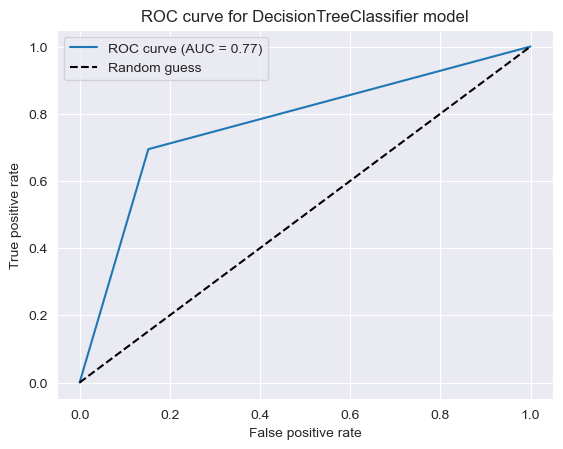

In [125]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Initialize the DecisionTreeClassifier model
dtc = DecisionTreeClassifier()

# Train the model on the training data
dtc.fit(X_train, y_train)

# Predict probabilities for the test data
y_probs = dtc.predict_proba(X_test)[:, 1]

# Calculate the ROC curve and AUC score
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
auc_score = roc_auc_score(y_test, y_probs)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'k--', label='Random guess')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve for DecisionTreeClassifier model')
plt.legend(loc='best')
plt.show()

In [126]:
from sklearn.metrics import roc_auc_score

# Fit the model on the training data
dtc.fit(X_train, y_train)

# Predict probabilities for the test set
y_pred_proba = dtc.predict_proba(X_test)[:, 1]

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("AUC score:", roc_auc)

AUC score: 0.7401761517615175


As we have plotted ROC curve for dtc model and found AUC score is 74%.

# Save The Model

In [127]:
# Save the model using joblib
joblib.dump(dtc, 'fraud_reported_model.joblib')

['fraud_reported_model.joblib']